# Esame Corso di Data Science e Applicazione in Fisica - Alessandro Filippucci
### A.A 2022/2023
# Studio della Relazione tra Epidemiologia del Covid-19 e Inquinamento da polveri sottili - periodo gennaio-giugno 2020

## COSE DA AGGIUNGERE E CORREGGERE
- PUNTO 6 : Risolvere la situazione in qualche modo. 
- PUNTO 8 : Aggiungere parte sulla visualizzazione dell'andamento degli errori al variare di alpha.

## Pre-processing




### Preparazione dei dati

1. Ricercare i valori nulli dalle colonne
2. Eliminare i valori nulli dalle colonne
3. Eliminare colonne inutili

## Svolgimento della preparzione dei dati:

Prima di iniziare a lavorare sui dati per qualsiasi tipo di studio, è necessario avere bene in mente il tipo di dati con cui si sta trattando, il contenuto del dataset fornito e le caratteristiche che possiede.  
La fase di preparazione dei dati serve proprio a questo, e viene seguita da una fase in cui vengono visualizzati i dati per trarne informazioni aggiuntive.  
La preparazione inizia con il trattamento di eventuali dati mancanti, cominciando proprio dalla loro ricerca nel dataset e nella determinazione della loro posizione specifica. Una volta individuati, si dovrà scegliere come trattarli.  



Inizialmente, sono stati caricati i vari import che generalmente vengono utilizzati per fare Data Analysis. In particolare, Pandas permette di fare operazioni sui dataframe e di trattare, quindi, i dati di questo progetto.  
È pratica comune e buona abitudine dare uno sguardo ai dati su cui si andrà a lavorare, come di seguito:  

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

cv19_data = pd.read_csv("dataset_exam.csv")
cv19_data.head()

,Unnamed: 0,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,...,mean_pm10_ug/m3_std_2019,mean_pm10_ug/m3_median_2019,max_pm10_ug/m3_median_2019,max_pm10_ug/m3_mean_2019,max_pm10_ug/m3_std_2019,min_pm10_ug/m3_median_2019,min_pm10_ug/m3_mean_2019,min_pm10_ug/m3_std_2019,Zone,Region
0,0,Acquasparta,42.691173,12.546451,4611,57.0,81.61,1.013507,6,1,...,7.288500,14.674647,27.591324,31.958118,15.960667,6.754477,7.535171,4.595696,collinare e montana,Umbria
1,1,Allerona,42.812033,11.973053,1722,21.0,82.61,-1.309272,3,1,...,7.038712,14.752206,26.312595,30.565736,18.320679,4.790663,5.623008,3.754214,collinare e montana,Umbria
2,2,Alviano,42.588208,12.295936,1428,60.0,23.90,-2.148882,2,1,...,8.908002,19.626043,30.008255,34.685780,17.674601,8.948166,9.722944,5.046609,collinare e montana,Umbria
3,3,Amelia,42.553528,12.416776,11852,89.0,132.50,-0.832084,5,1,...,7.749981,16.706606,31.103338,36.154165,19.364122,7.095291,7.938031,4.636137,collinare e montana,Umbria
4,4,Arrone,42.583433,12.769865,2703,66.0,41.04,-0.479919,7,1,...,7.416702,12.388708,26.191957,32.194737,20.364874,3.970692,4.888365,4.001205,collinare e montana,Umbria


In [2]:
cv19_data.describe()

,Unnamed: 0,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,mean_pm10_ug/m3_median_jan_jun_2020.1,mean_pm10_ug/m3_mean_2019,mean_pm10_ug/m3_std_2019,mean_pm10_ug/m3_median_2019,max_pm10_ug/m3_median_2019,max_pm10_ug/m3_mean_2019,max_pm10_ug/m3_std_2019,min_pm10_ug/m3_median_2019,min_pm10_ug/m3_mean_2019,min_pm10_ug/m3_std_2019
count,92.00000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,...,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,92.000000,91.000000
mean,45.50000,42.905182,12.472221,9568.315217,89.459565,92.003804,-0.455099,15.054348,2.673913,0.801545,...,14.475831,16.430487,7.788327,14.892218,26.885255,31.688390,17.816801,6.811227,7.711917,4.654767
std,26.70206,0.273627,0.292700,22012.983364,108.091455,96.297586,1.357775,39.688447,6.293392,1.988844,...,3.014723,2.620349,0.571131,2.769346,4.958767,5.724870,4.342591,2.446697,2.315385,0.580559
min,0.00000,42.403124,11.973053,96.000000,2.390000,10.000000,-5.251338,0.000000,0.000000,0.000000,...,7.420084,10.744741,6.939437,8.817261,16.463018,20.667668,11.513608,2.064677,3.186399,3.456098
25%,22.75000,42.703714,12.234268,1573.750000,32.000000,35.735000,-1.204914,0.000000,0.000000,0.000000,...,12.673209,14.608065,7.387661,12.719118,24.180037,28.689235,15.211227,4.708499,5.667794,4.339893
50%,45.50000,42.873417,12.481221,2946.500000,66.500000,58.935000,-0.492604,5.000000,1.000000,0.185896,...,15.098714,16.623700,7.648703,15.328800,26.361343,30.668131,16.763086,6.894947,7.793400,4.710882
75%,68.25000,43.073766,12.718593,6913.500000,108.000000,97.267500,0.351280,11.000000,3.000000,0.853774,...,16.377223,18.087417,8.057968,16.689253,28.995770,34.065552,19.255928,8.779966,9.510887,4.934252
max,91.00000,43.548980,13.092928,166969.000000,787.000000,525.780000,2.872051,332.000000,51.000000,14.971698,...,21.254544,22.373268,9.674192,20.719354,48.968746,56.453095,35.787022,11.958206,12.722304,6.477983


### Pre-processing 1:

Come menzionato sopra, la prima cosa da fare è cercare i valori mancanti nel dataframe. Nella cella sottostante è stato usato il metodo "isnull" per farlo, seguito dall'applicazione del metodo "sum" per ottenere il loro numero totale.   Vengono mostrati i valori nulli e le loro posizioni all'interno delle colonne del dataframe.   
Come si vede, ci sono due valori nulli in due differenti colonne.

In [3]:
valori_nulli = cv19_data.isnull().sum()
n_nulli = valori_nulli.sum()

In [4]:
print('Totale Valori Nulli : ', n_nulli, '\n')
print('Posizione nel Dataframe dei valori nulli: \n')
valori_nulli

Totale Valori Nulli :  2 

Posizione nel Dataframe dei valori nulli: 



Unnamed: 0                               0
City                                     0
lat                                      0
lng                                      0
Population                               0
Density                                  0
Surface                                  0
Depriv_idx                               0
CovidCases_jan_jun_2020                  0
MaxHospitalized_jan_jun_2020             0
AvgHospitalized_jan_jun_2020             0
Deceased_jan_jun_2020                    0
MaxIntensiveCare_jan_jun_2020            0
AvgIntensiveCare_jan_jun_2020            0
mean_pm10_ug/m3_mean_jan_jun_2020        0
mean_pm10_ug/m3_std_jan_jun_2020         0
mean_pm10_ug/m3_median_jan_jun_2020      0
max_pm10_ug/m3_mean_jan_jun_2020         0
max_pm10_ug/m3_std_jan_jun_2020          0
max_pm10_ug/m3_median_jan_jun_2020       0
min_pm10_ug/m3_mean_jan_jun_2020         0
min_pm10_ug/m3_std_jan_jun_2020          0
min_pm10_ug/m3_median_jan_jun_2020       0
mean_pm10_u

### Pre-processing 2:
Ora, il trattamento dei valori mancanti viene fatto tramite il loro drop dal dataframe (vengono gettati). Però si deve prima riflettere su come eseguire questo drop. Si hanno due opzioni:
- Fare il drop della colonna che contiene il valore mancante, gettando anche tutta l'informazione derivante da altre righe
- Fare il drop della riga, che significa gettare tutte le informazioni non nulle contenuta in essa

Per decidere si è notato che uno dei valori trovati è nella colonna "Region", ma essendo il dataframe composto di soli comuni umbri non è di per sè una colonna interessante da mantenere. In questo caso si preferirebbe un drop della colonna.    
L'altra colonna interessata è riferita ai valori di inquinamento nel 2019. Siccome il coronavirus non è stato presente durante quell'anno, ai fini dello studio della relazione tra epidemiologia del covid e territorio, è una colonna che a primo impatto può sembrare meno utile delle altre, conteneti informazioni sull'epidemiologia e l'inquinamento nel 2020.  
Da queste considerazioni si è scelto di mantenere le informazioni delle righe che presentano valori nulli in queste due colonne e scartare quest'ultime: 

In [5]:
cv19_drop = cv19_data.dropna(axis=1)
nomi_colonne = cv19_drop.columns.tolist()
verticale = "\n".join(nomi_colonne) #mostra gli elementi della lista in verticale
print('Colonne rimantenti : \n ', verticale, '\n')

Colonne rimantenti : 
  Unnamed: 0
City
lat
lng
Population
Density
Surface
Depriv_idx
CovidCases_jan_jun_2020
MaxHospitalized_jan_jun_2020
AvgHospitalized_jan_jun_2020
Deceased_jan_jun_2020
MaxIntensiveCare_jan_jun_2020
AvgIntensiveCare_jan_jun_2020
mean_pm10_ug/m3_mean_jan_jun_2020
mean_pm10_ug/m3_std_jan_jun_2020
mean_pm10_ug/m3_median_jan_jun_2020
max_pm10_ug/m3_mean_jan_jun_2020
max_pm10_ug/m3_std_jan_jun_2020
max_pm10_ug/m3_median_jan_jun_2020
min_pm10_ug/m3_mean_jan_jun_2020
min_pm10_ug/m3_std_jan_jun_2020
min_pm10_ug/m3_median_jan_jun_2020
mean_pm10_ug/m3_mean_jan_jun_2020.1
mean_pm10_ug/m3_std_jan_jun_2020.1
mean_pm10_ug/m3_median_jan_jun_2020.1
mean_pm10_ug/m3_mean_2019
mean_pm10_ug/m3_std_2019
mean_pm10_ug/m3_median_2019
max_pm10_ug/m3_median_2019
max_pm10_ug/m3_mean_2019
max_pm10_ug/m3_std_2019
min_pm10_ug/m3_median_2019
min_pm10_ug/m3_mean_2019
Zone 



In [6]:
cv19_drop

,Unnamed: 0,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,...,mean_pm10_ug/m3_median_jan_jun_2020.1,mean_pm10_ug/m3_mean_2019,mean_pm10_ug/m3_std_2019,mean_pm10_ug/m3_median_2019,max_pm10_ug/m3_median_2019,max_pm10_ug/m3_mean_2019,max_pm10_ug/m3_std_2019,min_pm10_ug/m3_median_2019,min_pm10_ug/m3_mean_2019,Zone
0,0,Acquasparta,42.691173,12.546451,4611,57.00,81.61,1.013507,6,1,...,15.089290,16.258196,7.288500,14.674647,27.591324,31.958118,15.960667,6.754477,7.535171,collinare e montana
1,1,Allerona,42.812033,11.973053,1722,21.00,82.61,-1.309272,3,1,...,14.280218,15.874484,7.038712,14.752206,26.312595,30.565736,18.320679,4.790663,5.623008,collinare e montana
2,2,Alviano,42.588208,12.295936,1428,60.00,23.90,-2.148882,2,1,...,19.562969,20.957803,8.908002,19.626043,30.008255,34.685780,17.674601,8.948166,9.722944,collinare e montana
3,3,Amelia,42.553528,12.416776,11852,89.00,132.50,-0.832084,5,1,...,16.210499,17.890738,7.749981,16.706606,31.103338,36.154165,19.364122,7.095291,7.938031,collinare e montana
4,4,Arrone,42.583433,12.769865,2703,66.00,41.04,-0.479919,7,1,...,12.296421,14.221094,7.416702,12.388708,26.191957,32.194737,20.364874,3.970692,4.888365,collinare e montana
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,87,Tuoro_sul_Trasimeno,43.206848,12.074615,3810,68.00,55.89,-1.037773,0,0,...,16.056410,17.832678,8.044015,16.669778,26.659630,30.684311,16.006453,7.652437,8.581031,collinare e montana
88,88,Umbertide,43.305636,12.336622,16598,83.00,200.83,1.316157,29,4,...,14.874236,16.847611,8.024829,15.469442,31.068005,38.008366,23.129139,6.702140,7.855123,di valle
89,89,Valfabbrica,43.158897,12.600896,3286,36.00,92.30,0.868986,8,3,...,14.275885,15.861026,7.626592,14.094612,25.738884,29.684339,16.050027,7.477568,8.438524,collinare e montana
90,90,Vallo_di_Nera,42.754621,12.863760,357,9.86,36.22,1.624309,0,0,...,10.104532,12.658412,7.429745,10.847563,21.805939,26.849045,15.005412,4.257488,5.472269,collinare e montana


Come si vede, il numero di colonne totali è passato da 37 a 35, cioè sono state effettivamente scartate le colonne non ritenute necessarie, contententi i valori nulli.

### Pre-processing 3:

In generale, all'interno di un dataframe è possibile trovare colonne (features) con informazioni poco o per nulla utili, o anche ridondanti. Nel caso in esame, andando a vedere le features è stato notato come tre di esse presentassero nomi identici ad altre features, seguite da un ".1". Fa pensare a delle possibili informazioni ridondanti, per cui si è svolto un confronto tra tutti i valori di tutte le features per individuare eventuali ridondanze.  
Per farlo è stato utilizzato un tool in grado di eseguire tutte le combinazioni possibili iterativamente. Se la condizione di uguaglianza, applicati a tutti i valori presenti nella colonna tramite il metodo "all", viene rispettata, allora si ha la conferma di una features ridondante che può essere scartata senza perdita di informazione.

Inoltre è stata scartata la colonna denominata "Unnamed 0", in quanto serve solo da indice per le righe nel dataframe.

In [7]:
import itertools

#Ricerca di colonne uguali
drop_colonne = [c2 for c1, c2 in itertools.combinations(cv19_drop.columns, 2) if (cv19_drop[c1] == cv19_drop[c2]).all()]
drop_colonne.append(cv19_drop['Unnamed: 0'].name)

print('Colonne escluse dal Dataframe:')
drop_colonne

Colonne escluse dal Dataframe:


['mean_pm10_ug/m3_mean_jan_jun_2020.1',
 'mean_pm10_ug/m3_std_jan_jun_2020.1',
 'mean_pm10_ug/m3_median_jan_jun_2020.1',
 'Unnamed: 0']

In [8]:
cv19_cleared = cv19_drop.drop(columns=drop_colonne)
cv19_cleared.head()

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,min_pm10_ug/m3_median_jan_jun_2020,mean_pm10_ug/m3_mean_2019,mean_pm10_ug/m3_std_2019,mean_pm10_ug/m3_median_2019,max_pm10_ug/m3_median_2019,max_pm10_ug/m3_mean_2019,max_pm10_ug/m3_std_2019,min_pm10_ug/m3_median_2019,min_pm10_ug/m3_mean_2019,Zone
0,Acquasparta,42.691173,12.546451,4611,57.0,81.61,1.013507,6,1,0.273585,...,5.875184,16.258196,7.288500,14.674647,27.591324,31.958118,15.960667,6.754477,7.535171,collinare e montana
1,Allerona,42.812033,11.973053,1722,21.0,82.61,-1.309272,3,1,0.336735,...,4.329871,15.874484,7.038712,14.752206,26.312595,30.565736,18.320679,4.790663,5.623008,collinare e montana
2,Alviano,42.588208,12.295936,1428,60.0,23.90,-2.148882,2,1,0.252632,...,8.142606,20.957803,8.908002,19.626043,30.008255,34.685780,17.674601,8.948166,9.722944,collinare e montana
3,Amelia,42.553528,12.416776,11852,89.0,132.50,-0.832084,5,1,0.317308,...,6.741657,17.890738,7.749981,16.706606,31.103338,36.154165,19.364122,7.095291,7.938031,collinare e montana
4,Arrone,42.583433,12.769865,2703,66.0,41.04,-0.479919,7,1,0.475728,...,3.460392,14.221094,7.416702,12.388708,26.191957,32.194737,20.364874,3.970692,4.888365,collinare e montana


Adesso il dataframe è composto da 31 colonne, dalle 37 di partenza.  
Per riassumere, sono state tolte tre colonne con nomi ripetuti, una che mostrava gli indici delle righe, la colonna per la Regione e la colonna che conteneva un valore nullo riferita all'inquinamento del 2019.  
Il dataframe pre-processato, o sue modifiche future e sotto-dataframe, sarà usato per raggiungere lo scopo del progetto.

## Nota: Colonne relative al 2019
Nel dataframe sono presenti colonne con dati riferiti al 2019, mentre lo studio in esame prende come riferimento il periodo gennaio-giungo 2020. Si potrebbe pensare di eliminare queste features dal dataframe e snellirlo ancor di più, ma non si può dire a priori se l'inquinamento del 2019 e quello del 2020 abbiano una correlazione tra loro. Si può presuppore a primo impatto che i dati dell'uno dipendano da quelli dell'altro, dato che sono riferiti a tempi successivi. In seguito nel progetto verrà costruita la matrice di correlazione tra tutte le features, e a quel punto si potrà dire se i dati del 2019 sono utili o meno.

### NOTA: comune di Giove
Durante lo svolgimento del progetto, in particolare nello sviluppo dei grafici su mappa, si è notato che i dati del comune di Giove non sono effettivamente localizzati nella zona del comune.  
Da internet sono state trovate le coordinate corrette e vengono di seguito modificate:

In [9]:
indice_giove = cv19_cleared.index[cv19_cleared['City'] == 'Giove'].tolist() #recupera l'indice riga di Giove
cv19_cleared.loc[indice_giove[0], "lat"] = 42.5103083 #sostituisce la latitudine e la longitudine di Giove nel Dataframe
cv19_cleared.loc[indice_giove[0], "lng"] = 12.3315972

### Plots

3. Creare due grafici che mettono in relazioni variabili relative a demografia, epidemiologia e geografia del territorio.

  3.1 (**Extra**)

  * inserire nelle tooltip il nome della città;
  * creare un plot dove la terza feature da mettere in relazione è selezionabile a piacere tra le colonne del data frame. Sugli assi principali si trovano rispettivamente Population e Density.

## Svolgimento: Visualizzazione delle Features
Qui vengono creati dei grafici per la visualizzazione delle features, che possono essere separate in tre macro-aree: demografia, epidemiologia e geografia. Lo scopo è visualizzare le relazioni di queste features e cercare di individuare ad occhio eventuali anomali da approfondire.  

I grafici costruiti danno la possibilità di scegliere interattivamente una features per ogni macro-area alla volta tramite menù a tendina. Nel caso in esame, sulle ascisse sono presenti variabili demografiche, sulle ordinate variabili epidemiologiche e sull'asse z (colore) variabili geografiche.

In [10]:
import plotly.express as px
import ipywidgets as widgets
from ipywidgets import interact
from IPython.display import display

Nella celle sottostanti vengono eseguite le divisioni in macro-aree, sulla base delle descrizioni presenti nel documento "features_definition" fornito per lo svolgimento del progetto.

In [11]:
all_features = cv19_cleared.columns.tolist() #lista con nomi di tutte le features
all_features

['City',
 'lat',
 'lng',
 'Population',
 'Density',
 'Surface',
 'Depriv_idx',
 'CovidCases_jan_jun_2020',
 'MaxHospitalized_jan_jun_2020',
 'AvgHospitalized_jan_jun_2020',
 'Deceased_jan_jun_2020',
 'MaxIntensiveCare_jan_jun_2020',
 'AvgIntensiveCare_jan_jun_2020',
 'mean_pm10_ug/m3_mean_jan_jun_2020',
 'mean_pm10_ug/m3_std_jan_jun_2020',
 'mean_pm10_ug/m3_median_jan_jun_2020',
 'max_pm10_ug/m3_mean_jan_jun_2020',
 'max_pm10_ug/m3_std_jan_jun_2020',
 'max_pm10_ug/m3_median_jan_jun_2020',
 'min_pm10_ug/m3_mean_jan_jun_2020',
 'min_pm10_ug/m3_std_jan_jun_2020',
 'min_pm10_ug/m3_median_jan_jun_2020',
 'mean_pm10_ug/m3_mean_2019',
 'mean_pm10_ug/m3_std_2019',
 'mean_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_mean_2019',
 'max_pm10_ug/m3_std_2019',
 'min_pm10_ug/m3_median_2019',
 'min_pm10_ug/m3_mean_2019',
 'Zone']

In [12]:
features_demografia = [all_features[0], all_features[3], all_features[4], all_features[6]]
features_demografia

['City', 'Population', 'Density', 'Depriv_idx']

Per quanto riguarda le feature di epidemiologia, una visualizzazione contenente informazioni utili si ottiene se si normalizzano i dati alla popolazione o alla densità di popolazione. Di seguito viene eseguita questa normalizzazione e vengono sostituiti i nomi delle features nel dataframe per evitare di creare eventuale confusione in seguito.

In [13]:
start = 7 
end = 12
features_epidemiologia = all_features[start:end+1]
features_epidemiologia

['CovidCases_jan_jun_2020',
 'MaxHospitalized_jan_jun_2020',
 'AvgHospitalized_jan_jun_2020',
 'Deceased_jan_jun_2020',
 'MaxIntensiveCare_jan_jun_2020',
 'AvgIntensiveCare_jan_jun_2020']

Di seguito la normalizzazione sulla popolazione di ogni comune. In particolare, al dataframe già esistente viene concatenato il dataframe contenente le sole features sottoposte a normalizzazione. Viene fatto dopo aver cambiato le label di quest'ultimo dataframe. Il risultato è un dataframe contenente sia le features originali (derivante dal pre-processing iniziale), che le nuove features normalizzate.

In [14]:
cv19_norm = cv19_cleared[features_epidemiologia]
cv19_norm = cv19_norm.div(cv19_cleared['Population'], axis=0)

col = cv19_norm.columns.tolist() #metto in una lista i nomi delle features normalizzate da rinominare
for c in col:
    nuovo_nome = f"{c}/Population"
    cv19_norm.rename(columns={c: nuovo_nome}, inplace=True)
col1 = cv19_norm.columns.tolist()
col1

['CovidCases_jan_jun_2020/Population',
 'MaxHospitalized_jan_jun_2020/Population',
 'AvgHospitalized_jan_jun_2020/Population',
 'Deceased_jan_jun_2020/Population',
 'MaxIntensiveCare_jan_jun_2020/Population',
 'AvgIntensiveCare_jan_jun_2020/Population']

In [15]:
cv19_norm_pop = pd.concat([cv19_cleared, cv19_norm], axis=1)
cv19_norm_pop.head()

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,max_pm10_ug/m3_std_2019,min_pm10_ug/m3_median_2019,min_pm10_ug/m3_mean_2019,Zone,CovidCases_jan_jun_2020/Population,MaxHospitalized_jan_jun_2020/Population,AvgHospitalized_jan_jun_2020/Population,Deceased_jan_jun_2020/Population,MaxIntensiveCare_jan_jun_2020/Population,AvgIntensiveCare_jan_jun_2020/Population
0,Acquasparta,42.691173,12.546451,4611,57.0,81.61,1.013507,6,1,0.273585,...,15.960667,6.754477,7.535171,collinare e montana,0.001301,0.000217,0.000059,0.000000,0.000217,0.000016
1,Allerona,42.812033,11.973053,1722,21.0,82.61,-1.309272,3,1,0.336735,...,18.320679,4.790663,5.623008,collinare e montana,0.001742,0.000581,0.000196,0.000000,0.000000,0.000000
2,Alviano,42.588208,12.295936,1428,60.0,23.90,-2.148882,2,1,0.252632,...,17.674601,8.948166,9.722944,collinare e montana,0.001401,0.000700,0.000177,0.000000,0.000000,0.000000
3,Amelia,42.553528,12.416776,11852,89.0,132.50,-0.832084,5,1,0.317308,...,19.364122,7.095291,7.938031,collinare e montana,0.000422,0.000084,0.000027,0.000084,0.000000,0.000000
4,Arrone,42.583433,12.769865,2703,66.0,41.04,-0.479919,7,1,0.475728,...,20.364874,3.970692,4.888365,collinare e montana,0.002590,0.000370,0.000176,0.000740,0.000000,0.000000


Di seguito, invece, la normalizzazione sulla densità di popolazione. Nella pratica, si sono create 6 features aggiuntive da concatenare con il dataframe già esistenze, così da avere a disposizione le differenti normalizzazioni in un unico dataframe.

In [16]:
cv19_norm1 = cv19_cleared[features_epidemiologia]
cv19_norm1 = cv19_norm1.div(cv19_cleared['Density'], axis=0)

Col = cv19_norm1.columns.tolist() #metto in una lista i nomi delle features normalizzate da rinominare
for c in Col:
    nuovo_nome = f"{c}/Density"
    cv19_norm1.rename(columns={c: nuovo_nome}, inplace=True)
Col1 = cv19_norm1.columns.tolist()
Col1

['CovidCases_jan_jun_2020/Density',
 'MaxHospitalized_jan_jun_2020/Density',
 'AvgHospitalized_jan_jun_2020/Density',
 'Deceased_jan_jun_2020/Density',
 'MaxIntensiveCare_jan_jun_2020/Density',
 'AvgIntensiveCare_jan_jun_2020/Density']

In [17]:
cv19_norm_finale = pd.concat([cv19_norm_pop, cv19_norm1], axis=1)
cv19_norm_finale.head()

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,AvgHospitalized_jan_jun_2020/Population,Deceased_jan_jun_2020/Population,MaxIntensiveCare_jan_jun_2020/Population,AvgIntensiveCare_jan_jun_2020/Population,CovidCases_jan_jun_2020/Density,MaxHospitalized_jan_jun_2020/Density,AvgHospitalized_jan_jun_2020/Density,Deceased_jan_jun_2020/Density,MaxIntensiveCare_jan_jun_2020/Density,AvgIntensiveCare_jan_jun_2020/Density
0,Acquasparta,42.691173,12.546451,4611,57.0,81.61,1.013507,6,1,0.273585,...,0.000059,0.000000,0.000217,0.000016,0.105263,0.017544,0.004800,0.000000,0.017544,0.001324
1,Allerona,42.812033,11.973053,1722,21.0,82.61,-1.309272,3,1,0.336735,...,0.000196,0.000000,0.000000,0.000000,0.142857,0.047619,0.016035,0.000000,0.000000,0.000000
2,Alviano,42.588208,12.295936,1428,60.0,23.90,-2.148882,2,1,0.252632,...,0.000177,0.000000,0.000000,0.000000,0.033333,0.016667,0.004211,0.000000,0.000000,0.000000
3,Amelia,42.553528,12.416776,11852,89.0,132.50,-0.832084,5,1,0.317308,...,0.000027,0.000084,0.000000,0.000000,0.056180,0.011236,0.003565,0.011236,0.000000,0.000000
4,Arrone,42.583433,12.769865,2703,66.0,41.04,-0.479919,7,1,0.475728,...,0.000176,0.000740,0.000000,0.000000,0.106061,0.015152,0.007208,0.030303,0.000000,0.000000


Ora, l'output precedente mostra 43 features differenti nel dataframe. Si partica da un dataframe pre-processato contenente 31 features. Sono state aggiunte 6 features per ogni normalizzazione, cioè 12 features in totale. Ecco che il numero di features ora presenti è 43. Si è scelto di non gettare via fin da subito le features epidemiologiche originali. Verrà fatto all'occorrenza per i punti successivi del progetto.

In [18]:
inizio = 13
fine = 30
features_geografia = all_features[inizio:fine+1]
features_geografia

['mean_pm10_ug/m3_mean_jan_jun_2020',
 'mean_pm10_ug/m3_std_jan_jun_2020',
 'mean_pm10_ug/m3_median_jan_jun_2020',
 'max_pm10_ug/m3_mean_jan_jun_2020',
 'max_pm10_ug/m3_std_jan_jun_2020',
 'max_pm10_ug/m3_median_jan_jun_2020',
 'min_pm10_ug/m3_mean_jan_jun_2020',
 'min_pm10_ug/m3_std_jan_jun_2020',
 'min_pm10_ug/m3_median_jan_jun_2020',
 'mean_pm10_ug/m3_mean_2019',
 'mean_pm10_ug/m3_std_2019',
 'mean_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_mean_2019',
 'max_pm10_ug/m3_std_2019',
 'min_pm10_ug/m3_median_2019',
 'min_pm10_ug/m3_mean_2019',
 'Zone']

Ora, la seguente cella contiene la costruzione della funzione che permette la visualizzazione delle features come spiegato in precedenza. Questo avviene tramite la definizione di una funzione che ha come input i tre gruppi di features creati sopra, in modo che ogni gruppo venga associato ad un asse.

In [19]:
#Funzione per la creazione del plot interattivo:
def scatter_plot(col_demografia, col_epidemiologia, col_geografia):
    fig = px.scatter(cv19_norm_finale, x=col_demografia, y=col_epidemiologia, color=col_geografia, 
                     title="Plot di Demografia, Epidemiologia e Geografia")
    fig.update_traces(selector=dict(mode='markers+text', textposition='bottom center'))
    fig.update_xaxes(title_text="Demografia")
    fig.update_yaxes(title_text="Epidemiologia")
    fig.show()

Di seguito, invece, c'è la parte interattiva che permette di visualizzare i grafici costruiti richiamando la funzione della cella precedente e impostando i suoi input.  

Prima occorre notare che la lista "features_epidemiologia", per come è stata definita qualche cella più in alto, contiene le features originali, mentre per i grafici è bene utilizzare quelle normalizzate:

In [20]:
features_epi_norm = cv19_norm_finale.columns[-12:].tolist()
features_epi_norm

['CovidCases_jan_jun_2020/Population',
 'MaxHospitalized_jan_jun_2020/Population',
 'AvgHospitalized_jan_jun_2020/Population',
 'Deceased_jan_jun_2020/Population',
 'MaxIntensiveCare_jan_jun_2020/Population',
 'AvgIntensiveCare_jan_jun_2020/Population',
 'CovidCases_jan_jun_2020/Density',
 'MaxHospitalized_jan_jun_2020/Density',
 'AvgHospitalized_jan_jun_2020/Density',
 'Deceased_jan_jun_2020/Density',
 'MaxIntensiveCare_jan_jun_2020/Density',
 'AvgIntensiveCare_jan_jun_2020/Density']

In [21]:
# Creazione del menù a tendina per la scelta delle features da rappresentare
interact(scatter_plot, 
         col_demografia = widgets.Dropdown(options= features_demografia, description= 'Variable demografica'),
         col_epidemiologia = widgets.Dropdown(options= features_epi_norm, description= 'Variabile epidemiologica'),
         col_geografia = widgets.Dropdown(options= features_geografia, description= 'Variabile geografica')
        )

interactive(children=(Dropdown(description='Variable demografica', options=('City', 'Population', 'Density', '…

<function __main__.scatter_plot(col_demografia, col_epidemiologia, col_geografia)>

Nel primo grafico che viene creato (default), vengono mostrati i casi covid normalizzati alla popolazione per ogni comune. Alcuni di questi sembrano aver avuto delle situazioni particolari che hanno portato ad un aumento piuttosto elevato della percentuale di casi covid (Giove, Porano, Castel Giorgio), rispetto agli altri comuni umbri.  
Osservazioni del genere possono essere fatte modificando le features dal menù a tendina per cercare alcuni casi particolari, da cui l'importanza della visualizzazione dei dati prima del loro utilizzo effettivo per andare verso la ricerca della relazione scopo del progetto, tramite la costruzione di modelli di regressione.

## Extra:
In questo caso è stato ripetuto l'esercizio precedente, utilizzando i vincoli richiesti. Sui due assi principali sono state messe densità e popolazione, mentre tutte le altre features del dataframe sono state messe in un menù a tendina per poter essere scelte dall'utente.

In [22]:
def scatter_plot2(col_demografia, col_epidemiologia, col_geografia):
    fig = px.scatter(cv19_norm_finale, x=col_demografia, y=col_epidemiologia, color=col_geografia, 
                     title="Plot di Densità, Popolazione in relazione alle altre features", hover_name='City')
    fig.update_traces(selector=dict(mode='markers+text', textposition='bottom center'))
    fig.update_xaxes(title_text="Popolazione")
    fig.update_yaxes(title_text="Densità")
    fig.show()

In [23]:
all_features_norm = cv19_norm_finale.columns.tolist()
all_features_norm.remove('Population')
all_features_norm.remove('Density')

Popolazione = ['Population'] #messe in una lista perche' Dropdown non accetta stringhe singole
Densita = ['Density']
interact(scatter_plot2, 
         col_demografia = widgets.Dropdown(options= Popolazione, description= 'Popolazione'),
         col_epidemiologia = widgets.Dropdown(options= Densita, description= 'Densita'),
         col_geografia = widgets.Dropdown(options= all_features_norm, description= 'Variabile epidemiologica')
        )

interactive(children=(Dropdown(description='Popolazione', options=('Population',), value='Population'), Dropdo…

<function __main__.scatter_plot2(col_demografia, col_epidemiologia, col_geografia)>

4. Correlazione: studia la correlazione lineare tra le feature


## Svolgimento: Studio della Correlazione  

Per studiare la correlazione occorre calcolare la matrice di correlazione di tutto il dataframe, che consiste in una matrice pxp, dove p è il numero di features presenti nel dataframe. Questa matrice contiene i coefficienti di correlazione lineare tra le features, ovvero dei numeri che variano nell'intervallo [-1, 1] e che quantificano la relazione lineare tra le features coninvolte.  
Un valore pari a 1 indica una relazione lineare perfetta (infatti sulla diagonale della matrice ci sono tutti valori 1), un valore pari a -1 indica una relazione anti-lineare e un valore nullo indica completa assenza di relazione lineare tra le features confrontate. Essendo una matrice, ovviamente i confronti sono fatti a coppie.  


Il calcolo della matrice di correlazione è stato fatto usando il metodo .corr() sul dataframe e si è utilizzato un grafico di tipo "heatmap" per visualizzare i coefficienti di correlazione lineare nella matrice. Inoltre, a scopi di visualizzazione, è stata costruita la "scatter matrix", ovvero una matrice di plot, ognuno dei quali mette in relazione due features differenti del dataframe (stesso ragionamento della matrice di correlazione).

#### Encoding dei Categorici:

Prima di procedere con le azioni indicate sopra, vanno trattate le features categoriche (o qualitative). Quest'ultime sono features che possono assumere solo valori precisi, non variano liberamente su un intervallo reale come quelle quantitative.  
Il loro trattamento avviene tramite l'uso dell'encoding, un processo che associa dei valori numerici ad ogni scelta possibile per la features categorica in esame. In questo modo possono essere utilizzate anch'esse nel calcolo della matrice di correlazione.  

Nel dataframe sono presenti due differenti features categoriche: "City" e "Zone". La feature City contiene i nomi dei comuni, cioè informazioni non interessanti per il calcolo della correlazione tra features. Zone, invece, ha differenti valori unici che posso risultare utili per la correlazione con l'inquinamneto (varia sicuramente da zona collinare a zona di valle), ad esempio.

Ci sono vari metodi di encoding, ma quello utilizzato qui è il One-Hot Enconding. Il motivo è che i valori unici nella features Zone non sono ordinati in termini di importanza, per cui non è corretto associare ad essi dei valori numerici differenti. Il One Hot Encoding permette di associare ad ogni valore unico il valore 1 e costruisce delle "features manichino", (aggiunte al dataframe) una per ogni valore unico della feature. Queste nuove features contengono il valore 1 sulle righe in cui la feature Zone assumeva il determinato valore a cui si riferisce la feature, e zero altrove.   
Il risultato del caso è stata la creazione di tre features manichino differenti riempite di zero e 1 all'occorrenza.

In [24]:
cv19_encoded = pd.get_dummies(cv19_norm_finale, columns=['Zone'], prefix='Zona')
cv19_encoded = cv19_encoded.drop(["City"], axis=1)
colonne = cv19_encoded.columns.tolist()
colonne

['lat',
 'lng',
 'Population',
 'Density',
 'Surface',
 'Depriv_idx',
 'CovidCases_jan_jun_2020',
 'MaxHospitalized_jan_jun_2020',
 'AvgHospitalized_jan_jun_2020',
 'Deceased_jan_jun_2020',
 'MaxIntensiveCare_jan_jun_2020',
 'AvgIntensiveCare_jan_jun_2020',
 'mean_pm10_ug/m3_mean_jan_jun_2020',
 'mean_pm10_ug/m3_std_jan_jun_2020',
 'mean_pm10_ug/m3_median_jan_jun_2020',
 'max_pm10_ug/m3_mean_jan_jun_2020',
 'max_pm10_ug/m3_std_jan_jun_2020',
 'max_pm10_ug/m3_median_jan_jun_2020',
 'min_pm10_ug/m3_mean_jan_jun_2020',
 'min_pm10_ug/m3_std_jan_jun_2020',
 'min_pm10_ug/m3_median_jan_jun_2020',
 'mean_pm10_ug/m3_mean_2019',
 'mean_pm10_ug/m3_std_2019',
 'mean_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_median_2019',
 'max_pm10_ug/m3_mean_2019',
 'max_pm10_ug/m3_std_2019',
 'min_pm10_ug/m3_median_2019',
 'min_pm10_ug/m3_mean_2019',
 'CovidCases_jan_jun_2020/Population',
 'MaxHospitalized_jan_jun_2020/Population',
 'AvgHospitalized_jan_jun_2020/Population',
 'Deceased_jan_jun_2020/Population',


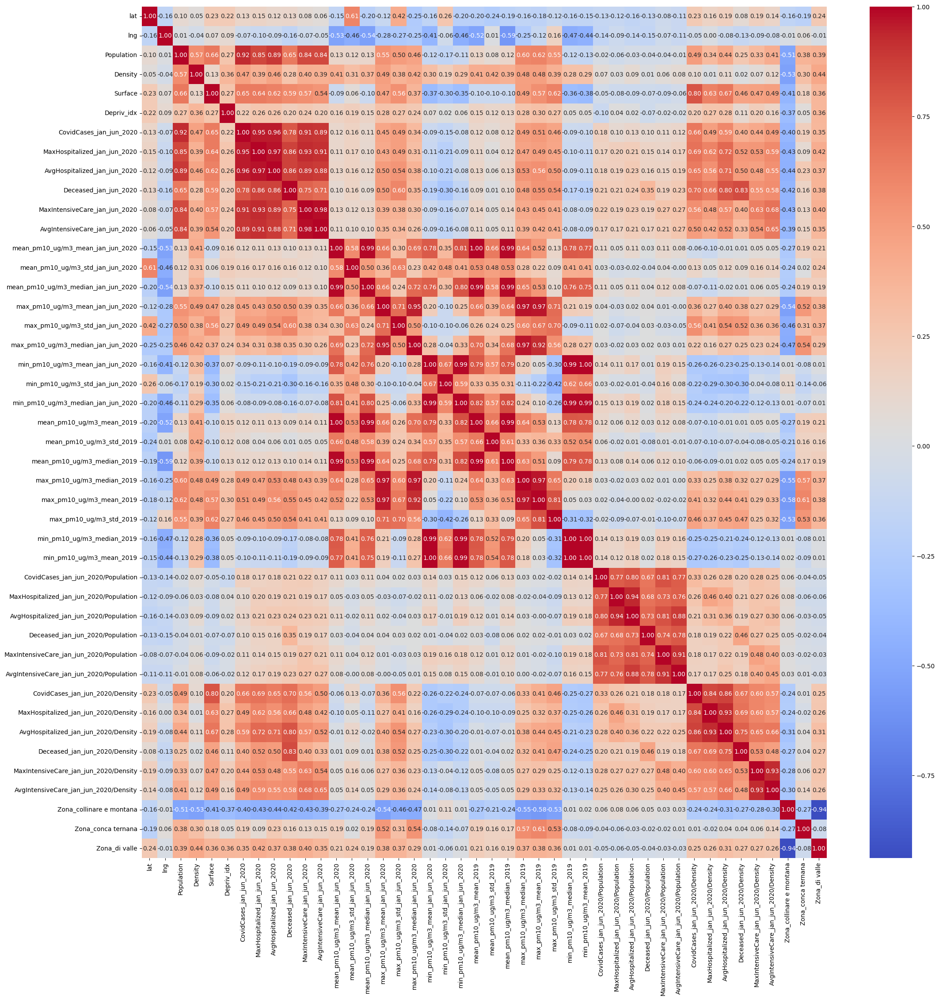

In [25]:
matrice_correlazione = cv19_encoded.corr()

#Heatmap per la matrice di correlazione
plt.figure(figsize=(25, 25))
sns.heatmap(matrice_correlazione, annot=True, cmap='coolwarm', fmt=".2f")
plt.show()

L'output precedente mostra la heatmap della matrice di correlazione risultante. In blu sono mostrati i coefficienti più vicini a -1 (anti-linearità), mentre in rosso i coefficienti vicini a 1 (linearità). Si possono fare osservazioni sulla struttura della matrice, notando che le feature sono raggruppate all'interno del dataframe nei gruppi precedentemente descritti.  
Infatti, la matrice sembra presentare dei blocchi che tendono al rosso e che contengono la diagonale. Questo vuol dire che le features all'interno dei gruppi di separazione (demografia, epidemiologia, geografia/territorio) sono molto correlate fra loro, come ci si potrebbe aspettare. Il notare ciò apre anche la strada ad una possibile riduzione di features, perchè quando sono strettamente correlate l'informazione che danno può essere ugualmente fornita da una sola di esse.  
I blocchi principalmente interessanti sono quelli relativi all'epidemiologia del covid (presenza di coefficienti molto elevati), sia i blocchi con le features normalizzate che non (la normalizzazione non aggiunge informazioni utili); l'altro blocco interessante, e anche quello più evidente, è relativo alle features di inquinamento. Sono presenti valori di correlazione elevata tra alcune features relative all'inquinamento del 2019 e a quello del 2020.  

In precedenza è stato anticipata la possibilità di eliminare le features del 2019 dal dataframe per un semplice motivo temporale, ma questo sarebbe risultato un errore. Prima di gettare queste features si dovrebbe approfondire la correlazione con le features relative alle stesse quantità nel 2020.

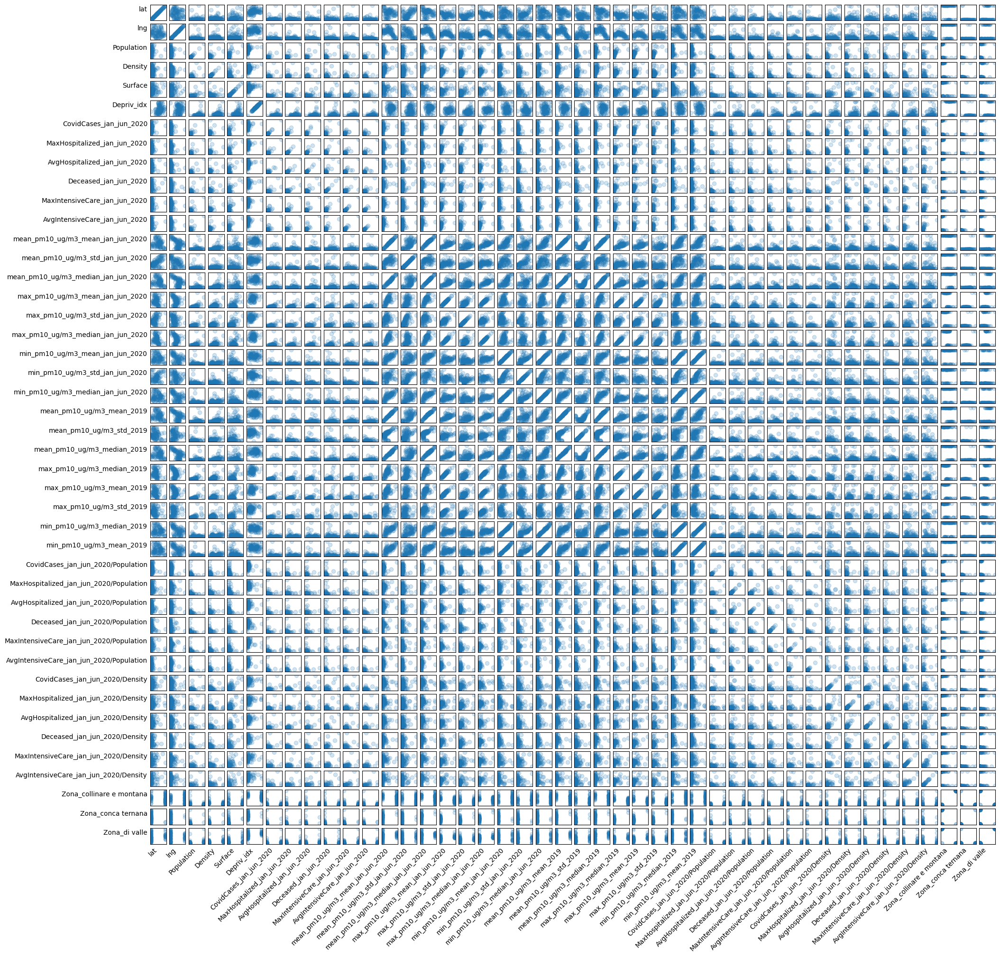

In [26]:
# Visualizzazione della scatter matrix
fig, axes = plt.subplots(nrows=len(cv19_encoded.columns), ncols=len(cv19_encoded.columns), figsize=(23, 23))
for i, c1 in enumerate(cv19_encoded.columns): #ciclo annidato che analizza ogni plot della scatter matrix separatamente
    for j, c2 in enumerate(cv19_encoded.columns):
        scatter = axes[i, j].scatter(cv19_encoded[c1], cv19_encoded[c2], alpha=0.2)
        axes[i, j].tick_params(axis='both', which='both', bottom=False, top=False, left=False, right=False, labelbottom=False, labelleft=False)  # Rimuovi ticks e label
        if i == len(cv19_encoded.columns) - 1:
            axes[i, j].set_xlabel(c2, rotation=45, ha='right')
            axes[i, j].set_xticks([])  # rimozione etichette sull'asse x nei singoli plot per pulire l'immagine (asse x)
        if j == 0:
            axes[i, j].set_ylabel(c1, rotation=0, ha='right')
            axes[i, j].set_yticks([])  # rimozione etichette sull'asse x nei singoli plot per pulire l'immagine (asse y)
        if i == len(cv19_encoded.columns) - 1 and j == 0:
            axes[i, j].set_xticks([])  # rimozione etichette sull'asse x nell'angolo in basso a sinistra
            axes[i, j].set_yticks([])  # rimozione etichette sull'asse y nell'angolo in basso a sinistra

# Aggiustamenti per la visualizzazione
for ax in axes[-1, :]:
    ax.xaxis.set_tick_params(rotation=45, labelbottom=True) #ruoto le label dell'asse x di 45 gradi
for ax in axes[:, 0]:
    ax.yaxis.set_tick_params(rotation=0, labelleft=True) #metto le label non ruotate a sinistra (asse y)

plt.show()


5. Maps (**Extra**): creare due esempi di grafici su mappa con delle colonne e punti che rappresentano delle informazioni sul territorio.

  5.1 *Show Density*: la colonna rappresenta la densità. Questa viene confermata dal colore, rosso dove la densità è più alta. Il colore utilizza le colonne Population e Surface.

  Le colonne devono prensentare come informazioni aggiuntive i seguenti dettagli:
  * Città
  * Densità
  * Popolazione 
  * Superfice

  5.2 *Show CovidCases*: la colonna rappresenta il numero di casi Covid. Il colore viene composto in base ai decessi, il numero medio di casi intensivi e numero medio di casi ospitalizzati. I decessi danno alla colonna un colore rosso.

  Le colonne devono prensentare come informazioni aggiuntive i seguenti dettagli:
  * Città
  * \# casi covid
  * avg. intensive care 
  * avg. hospitalized




## Svolgimento: Grafici su Mappe

In questa parte vengono create delle mappe geografiche per mostrate le informazioni sulle varie features del dataset. Si crea, infatti, un menù a tendina dove poter scegliere la features da rappresentare.  
Per raggiungere lo scopo, è stato preso da internet un file di tipo GeoJSON contenente i confini dei vari comuni umbri.   
Lo scopo di questo procedimento è quello di visualizzare al meglio le informazioni al fine di fare confronti visivi tra comuni differenti.

In [27]:
import geopandas as gpd
import folium
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning) # ci sono dei FutureWarning che possiamo ignorare

Di seguito viene sostituito il nome del dataframe per semplicità, poi viene creato un dataframe di geopandas utilizzando il file geojson dell'umbria trovato da internet. Venongo poi mostrate le features presenti in questo dataframe.

In [28]:
df=cv19_norm_pop
gdf = gpd.read_file("limits_R_10_municipalities.geojson")
geo_col = gdf.columns.tolist()
geo_col

['name',
 'op_id',
 'minint_elettorale',
 'minint_finloc',
 'prov_name',
 'prov_istat_code',
 'prov_istat_code_num',
 'prov_acr',
 'reg_name',
 'reg_istat_code',
 'reg_istat_code_num',
 'opdm_id',
 'com_catasto_code',
 'com_istat_code',
 'com_istat_code_num',
 'geometry']

Per uniformare i nomi dei comuni presenti nel file geojson con quelli presenti nel dataframe originale, si fanno alcuni aggiustamenti. In particolare si sostituiscono alcuni caratteri presenti nei nomi:

In [29]:
df["name"]=df["City"].apply(
    lambda x: x.replace("dell_","dell'").replace("Citta","Città").replace("Sant_","Sant'").replace("d_","d'").replace(
        "_"," ")
)
df["name"]

0             Acquasparta
1                Allerona
2                 Alviano
3                  Amelia
4                  Arrone
             ...         
87    Tuoro sul Trasimeno
88              Umbertide
89            Valfabbrica
90          Vallo di Nera
91              Valtopina
Name: name, Length: 92, dtype: object

Ora è stata creata una nuova feature nel dataframe, composta dai nomi corretti. Per assicurarsi dell'effettiva coincidenza con i nomi nel file geojson, si esegue una verifica usando il metodo "equals" tra le due features "Comune" (dataframe originale) e "name" (geo-dataframe):

In [30]:
df["name"].sort_values().reset_index(drop=True).equals(gdf["name"].sort_values().reset_index(drop=True))

True

Il metodo "sort_values" assicura l'ordine alfabetico

Viene poi definita una mappa iniziale centrata sulla latitudine media dell'Umbria:

In [31]:
mappa = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=8)

Di seguito viene definita ed implementata la funzione che permette di ottenere l'output grafico della mappa e i suo cambiamenti al variare della feature mostrata (scelta dal menù a tendina).  
Gli argomenti della funzione sono, rispettivamente: 
- mappa di partenza (definita nella cella precedente);
- dataframe con le informazioni geografiche (nel caso in esame "gdf");
- dataframe originale su cui fare la mappa (nel caso in esame "df");
- colonna in comune tra i due dataframe (in questo caso i nomi dei comuni); 
- un parametro che stabilisce quale caratteristica del dataframe deve dare forma geometrica ai confini dei vari comuni (nel caso in esame i nomi);
- una lista di features da visualizzare quando il cursore passa sopra all'area di ogni comune;
- numero arbitrario di parametri aggiuntivi, possibile grazie al doppio asterisco.

L'oggetto che permette la costruzione della mappa così come la si vede nell'output è il "choropleat", che prende come input i vari dati descritti sopra. 

In [32]:
def choropleth_aggiornabile(mappa_iniziale, dati_geografici, dati, col_condivisa, par_geo, tooltip_features=[], zoom_start=8, **kwargs):
    
    def cambio_mappa(color_col, **interactive_kwargs):
        columns=[col_condivisa, color_col]
        folium_map = folium.Map(location=mappa_iniziale.location, zoom_start=zoom_start)
    
        choropleth = folium.Choropleth(geo_data=dati_geografici, data=dati, columns=columns, key_on=par_geo, name=color_col,
                                     legend_name=color_col, **kwargs, **interactive_kwargs)
        choropleth.add_to(folium_map) #aggiunge le caratteristiche dei dati geografici e di quelli originali alla mappa

        tooltip = tuple(set(columns+tooltip_features))
        for tltp in tooltip:
            for f in choropleth.geojson.data['features']:
                f['properties'][tltp] = str(dati.loc[dati[columns[0]]==f['properties'][columns[0]]].iloc[0][tltp])
        folium.GeoJsonTooltip(tooltip).add_to(choropleth.geojson)
        display(folium_map)
        
    return cambio_mappa


Una volta definita la funzione per la costruzione della mappa, si specificano gli input da passare per creare la mappa specifica richiesta dall'esercizio. Il risultato è una mappa interattiva che permette di scegliere la feature da visualizzare. Una volta selezionata, la mappa si aggiorna e mostra sempre gli stessi confini dei comuni presenti, cambiando le informazioni delle tooltip e cambiando il colore in base ai valori della feature mostrata.

In [33]:
tooltip_features=['Population','CovidCases_jan_jun_2020','Deceased_jan_jun_2020' ]

visualizzazione_feature = widgets.Dropdown(
    options=df.drop(["name", "City", "Zone"],axis=1).columns, description='Feature da visualizzare:',
    value="Deceased_jan_jun_2020/Population") #feature da rappresentare, richiesta dall'esericizio

input_mappa = widgets.interactive_output(
    choropleth_aggiornabile(
        mappa_iniziale=mappa,
        dati_geografici=gdf,
        dati=df,
        col_condivisa="name",
        par_geo='feature.properties.name',
        tooltip_features=tooltip_features,
        fill_color='Reds',
        fill_opacity=0.7,
        line_opacity=0.2,
        highlight=True,
        smooth_factor=0.5,
        overlay=True), { 'color_col': visualizzazione_feature })

display(visualizzazione_feature, input_mappa)

Dropdown(description='Feature da visualizzare:', index=32, options=('lat', 'lng', 'Population', 'Density', 'Su…

Output()

Ora, l'esercizio chiedeva anche di creare due mappe particolari: una riguardante la densità e una il numero di decessi. Di seguito viene creata una funzione molto simile alla precedente, senza la componente interattiva:

In [34]:
def aggiunta_choropleth(mappa_iniziale_folium, dati_geografici, dati, cols, par_geo, tooltip_features=[], zoom_start=8, **kwargs):
    
    choropleth = folium.Choropleth(geo_data=dati_geografici, data=dati, columns=cols, key_on=par_geo, **kwargs,)
    choropleth.add_to(mappa_iniziale_folium)

    tooltip = tuple(set(cols+tooltip_features))
    for tltp in tooltip:
        for f in choropleth.geojson.data['features']:
            f['properties'][tltp] = str(dati.loc[dati[cols[0]]==f['properties'][cols[0]]].iloc[0][tltp])
    
    folium.GeoJsonTooltip(tooltip).add_to(choropleth.geojson)
    folium.LayerControl().add_to(mappa_iniziale_folium)
        
    return mappa_iniziale_folium


## Mappa Densità
Per mostrare una mappa della densità, viene prima costruita una folium map da passare alla funzione e poi vengono definiti i parametri richiesti in input dalla funzione stessa:

In [35]:
mappa_densita = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=8)

aggiunta_choropleth(
    mappa_iniziale_folium=mappa_densita,
    dati_geografici=gdf,
    dati=df,
    cols=['name', 'Density'],
    par_geo='feature.properties.name',
    tooltip_features=['name','Density','Surface','Population'],
    name='Density',
    legend_name='Densità',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    highlight=True,
    smooth_factor=0.5,
)

## Mappa Casi Covid
Stesso discorso per la seconda mappa richiesta dall'esercizio:

In [36]:
mappa_densita = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=8)

aggiunta_choropleth(
    mappa_iniziale_folium=mappa_densita,
    dati_geografici=gdf,
    dati=df,
    cols=['name', 'Deceased_jan_jun_2020'],
    par_geo='feature.properties.name',
    tooltip_features=['name','Deceased_jan_jun_2020','CovidCases_jan_jun_2020','AvgHospitalized_jan_jun_2020', 'AvgIntensiveCare_jan_jun_2020'],
    name='Deceased_jan_jun_2020',
    legend_name='Deceased_jan_jun_2020',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    highlight=True,
    smooth_factor=0.5
)

## Modeling

### Unsupervised Learning

#### Clustering

6. Utilizzare KMeans per creare dei cluster partendo da un numero pari a 2 fino ad un massimo di 18. Utilizzare le seguenti feature:

  * Depriv_idx
  * CovidCases_jan_jun_2020 / Population
  * MaxHospitalized_jan_jun_2020 / Population
  * AvgHospitalized_jan_jun_2020 / Population
  * Deceased_jan_jun_2020 / Population
  * MaxIntensiveCare_jan_jun_2020 / Population
  * AvgIntensiveCare_jan_jun_2020 / Population
  * max_pm10_ug/m3_mean_jan_jun_2020
  * max_pm10_ug/m3_std_jan_jun_2020
  * max_pm10_ug/m3_median_jan_jun_2020
  * mean_pm10_ug/m3_mean_jan_jun_2020
  * mean_pm10_ug/m3_std_jan_jun_2020
  * mean_pm10_ug/m3_median_jan_jun_2020
  * min_pm10_ug/m3_mean_jan_jun_2020
  * min_pm10_ug/m3_std_jan_jun_2020
  * min_pm10_ug/m3_median_jan_jun_2020

  6.2 Fare un grafico dell'inerzia all'aumentare del numero di cluster.

  6.3 Maps (**Extra**): proiettare i risultati su mappa  utilizzando `lat` e `lng` e aggiungendo la feature `Zone` come categoria.



## Svolgimento: Clustering
Il clustering è una pratica che aiuta ad individuare delle caratteristiche comuni all'interno delle features presenti nel dataframe. L'esercizio richiede di applicare iterativamente il metodo KMeans su specifiche features del dataframe originale, variando il numero di cluster creati. Si parte da 2 (numero minimo possibile, altrimenti con un singolo cluster tutte le features apparterrebbero ad esso), fino ad un totale di 18. In precedenza nel progetto si è parlato di features appartenenti ad alcune macro-aree: epidemiologica, demografica e geografica. L'utilizzo di metodi di clusterizzazione può mostrare se una separazione del genere sia sensata o meno.  

L'algoritmo KMeans funziona nel seguente modo:
- Si seleziona il valore K iniziale;
- L'algoritmo sceglie in maniera casuale K punti nei dati, inidicati come "centroidi". Ognuno di essi serve come punto di riferimento per formare un cluster;
- Per ogni punto nel dataframe, viene calcolata la distanza (distanza euclidea nell'iper-spazio delle features) tra questo e i centroidi esistenti;
- Il punto viene classificato come appartenente al cluster relativo al centroide più vicino ad esso; 
- Ogni volta che un punto viene assegnato ad un centroide, quest'ultimo viene ricalcolato tra i presenti nello stesso cluster per minimizzare il più possibile una quantità chiamata "Inerzia". L'inerzia è la somma su tutti i punti del cluster della distanza al quadrato tra ogni punto e il centroide.;
- Il processo viene eseguito iterativamente fino a raggiungere la convergenza di ogni centroide nel proprio cluster, ovvero l'assenza dei loro spostamenti.

Questo è l'algoritmo relativo ad una singola scelta di K. Nel caso in esame, K deve variare tra 2 e 18 e si esegue quindi l'algoritmo un totale di 17 volte. Ogni volta, il risultato sarà una determinata custerizzazione dei dati a disposizione. Tra tutte, va scelta la migliore, che equivale a dire che va scelto il miglio K possibile.  
Per farlo, si è soliti utilizzare un metodo chiamato "Elbow Method", che viene descritto in seguito.

In [37]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

Ora, il KMeans è un metodo basato sul calcolo di distanze euclidee. Questo vuol dire che il risultato è suscettibile a valori definiti come "outliers", ovvero dei valori anomali rispetto alla distribuzione degli altri valori del dataframe. Per ridurre il loro impatto, è buona norma scalare i dati in maniera uniforme. Lo si è fatto usando lo Standard Scaler (SPIEGARE LA SCELTA), separando i conteggi (che sono tutti valori positivi) dalle altre variabili.

In [38]:
cv19_KMeans = cv19_norm_pop.loc[:, [
    'Depriv_idx',
    'CovidCases_jan_jun_2020/Population',
    'MaxHospitalized_jan_jun_2020/Population',
    'AvgHospitalized_jan_jun_2020/Population',
    'Deceased_jan_jun_2020/Population',
    'MaxIntensiveCare_jan_jun_2020/Population',
    'AvgIntensiveCare_jan_jun_2020/Population',
    'max_pm10_ug/m3_mean_jan_jun_2020',  
    'max_pm10_ug/m3_std_jan_jun_2020', 
    'max_pm10_ug/m3_median_jan_jun_2020',
    'mean_pm10_ug/m3_mean_jan_jun_2020',
    'mean_pm10_ug/m3_std_jan_jun_2020',
    'mean_pm10_ug/m3_median_jan_jun_2020',
    'min_pm10_ug/m3_mean_jan_jun_2020',
    'min_pm10_ug/m3_std_jan_jun_2020',
    'min_pm10_ug/m3_median_jan_jun_2020'
]]
cv19_KMeans

,Depriv_idx,CovidCases_jan_jun_2020/Population,MaxHospitalized_jan_jun_2020/Population,AvgHospitalized_jan_jun_2020/Population,Deceased_jan_jun_2020/Population,MaxIntensiveCare_jan_jun_2020/Population,AvgIntensiveCare_jan_jun_2020/Population,max_pm10_ug/m3_mean_jan_jun_2020,max_pm10_ug/m3_std_jan_jun_2020,max_pm10_ug/m3_median_jan_jun_2020,mean_pm10_ug/m3_mean_jan_jun_2020,mean_pm10_ug/m3_std_jan_jun_2020,mean_pm10_ug/m3_median_jan_jun_2020,min_pm10_ug/m3_mean_jan_jun_2020,min_pm10_ug/m3_std_jan_jun_2020,min_pm10_ug/m3_median_jan_jun_2020
0,1.013507,0.001301,0.000217,0.000059,0.000000,0.000217,0.000016,33.836615,17.647870,29.368190,16.448845,7.735424,15.089290,7.261863,4.781904,5.875184
1,-1.309272,0.001742,0.000581,0.000196,0.000000,0.000000,0.000000,33.495723,24.558868,27.071611,16.009011,8.708984,14.280218,5.148148,3.295273,4.329871
2,-2.148882,0.001401,0.000700,0.000177,0.000000,0.000000,0.000000,38.183899,20.920174,32.187719,22.556083,11.939011,19.562969,9.650757,5.429373,8.142606
3,-0.832084,0.000422,0.000084,0.000027,0.000084,0.000000,0.000000,36.719376,16.893413,32.944553,18.391294,8.453660,16.210499,7.836244,4.633759,6.741657
4,-0.479919,0.002590,0.000370,0.000176,0.000740,0.000000,0.000000,33.302903,21.477547,27.722733,13.751943,6.993753,12.296421,4.484330,4.012669,3.460392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,-1.037773,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.082157,25.999595,27.517476,19.158259,14.846033,16.056410,8.517483,6.329295,6.788182
88,1.316157,0.001747,0.000241,0.000061,0.000181,0.000120,0.000014,41.491070,32.647428,30.934160,17.415113,12.497089,14.874236,7.623645,6.196253,6.030676
89,0.868986,0.002435,0.000913,0.000144,0.000000,0.000304,0.000022,31.839459,20.831123,26.834015,16.041621,10.768399,14.275885,8.095071,5.552251,6.781332
90,1.624309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.703835,12.366944,23.362458,11.821318,6.803103,10.104532,5.164493,4.884321,3.610946


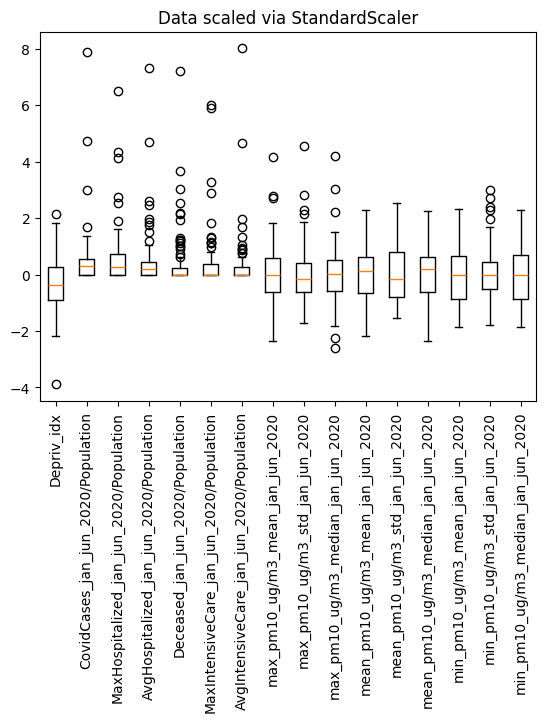

In [39]:
conteggi = ['Depriv_idx', 'CovidCases_jan_jun_2020/Population', 'MaxHospitalized_jan_jun_2020/Population',
    'AvgHospitalized_jan_jun_2020/Population', 'Deceased_jan_jun_2020/Population', 'MaxIntensiveCare_jan_jun_2020/Population',
    'AvgIntensiveCare_jan_jun_2020/Population']
cv19_conteggi = cv19_KMeans[conteggi]
cv19_altri = cv19_KMeans.drop(conteggi, axis=1)

scaler_conteggi = StandardScaler(with_mean=False)
scaler_altre = StandardScaler()

#Processo di Scaling
conteggi_scalati = scaler_conteggi.fit_transform(cv19_conteggi.values)
altre_scalate = scaler_altre.fit_transform(cv19_altri)
cv19_scalato = pd.DataFrame(conteggi_scalati, index=cv19_KMeans.index, columns=conteggi).join(pd.DataFrame(altre_scalate, index=cv19_KMeans.index, columns=cv19_altri.columns))

#Visualizzazione del risultato
plt.boxplot(cv19_scalato, labels=cv19_scalato.columns)
plt.title('Data scaled via StandardScaler')
plt.xticks(rotation=90)
plt.show()


Ora si applica l'algoritmo KMeans iterativamente. Si salvano i dati risultanti nel dataframe, creando nuove colonne.

In [40]:
# KMeans per k=2 fino a k=18
cv19_cluster = cv19_scalato.copy()
valori_k = range(2, 19)
inerzie = []
for k in valori_k:
    kmeans = KMeans(n_clusters=k, random_state=8)
    new_col = f"{k}_cluster"
    cv19_norm_pop[new_col] = kmeans.fit_predict(cv19_cluster) 
    cv19_norm_pop[new_col] = cv19_norm_pop[new_col].astype("category") #cosa fa?
    inerzie.append(kmeans.inertia_)

In [41]:
cv19_norm_pop.iloc[:,-17:]

,2_cluster,3_cluster,4_cluster,5_cluster,6_cluster,7_cluster,8_cluster,9_cluster,10_cluster,11_cluster,12_cluster,13_cluster,14_cluster,15_cluster,16_cluster,17_cluster,18_cluster
0,0,2,1,3,4,4,1,0,8,0,10,0,11,5,8,8,12
1,0,1,3,3,4,4,1,1,5,0,3,1,11,9,8,8,4
2,0,2,1,0,0,1,2,3,1,4,1,5,2,11,7,5,16
3,0,2,1,3,4,4,1,0,8,10,8,0,8,1,12,9,2
4,0,1,0,1,4,4,1,1,5,3,3,1,11,9,8,14,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,0,2,1,0,0,1,2,5,1,4,1,5,2,11,5,5,13
88,0,2,3,4,3,5,6,1,5,2,5,3,9,4,10,0,0
89,0,2,1,3,0,3,2,3,6,5,7,9,2,5,0,10,9
90,0,1,0,1,5,0,7,4,2,3,4,4,1,2,2,2,17


### Grafico dell'Inerzia
Precedentemente è stata definita matematicamente l'inerzia come la somma su tutti i punti del cluster della distanza al quadrato tra ogni punto e il centroide. Può essere interpretata come una misura della dispersione dei dati all'interno del cluster. Infatti, minore è il suo valore e minori saranno le distanze dei dati dal centroide scelto, quindi saranno meno dispersi.  
La tendenza dell'inerzia è quella di diminuire all'aumentare di numero di cluster, perchè dei cluster più "piccoli" avranno dei dati meno dispersi al loro interno. Il problema è che un numero elevato di cluster rende difficilmente interpretabili i risultati. Per cui si deve scegliere un buon compromesso tra il valore dell'inerzia e il numero di cluster accettabile per mantenere l'interpretazione.  
Solitamente per la scelta di k si utilizza l'Elbow Method, metodo a gomito, che consiste nel fare un grafico dell'inerzia al variare del numero di cluster e stabilire quando il guadagno di inerzia al costo di aggiunta di cluster smette di essere conveniente.

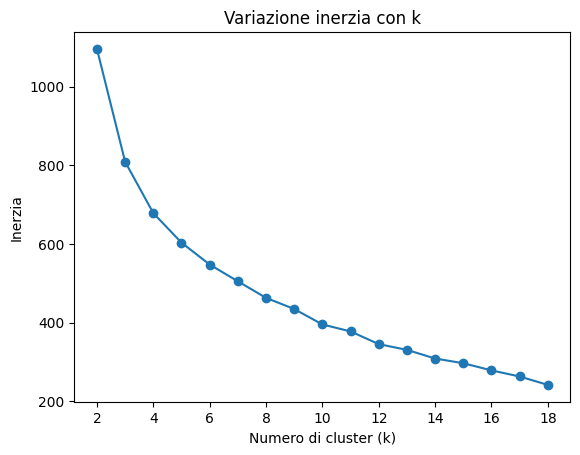

In [42]:
plt.plot(valori_k, inerzie, marker='o')
plt.xlabel('Numero di cluster (k)')
plt.ylabel('Inerzia')
plt.title('Variazione inerzia con k')
plt.show()

Si vede dal grafico che l'inerzia diminuisce significamente da k=3 a k=5, poi va a stabilizzarsi, decrescendo più o meno in maniera costante. Per cui ci si aspetta una buona clusterizzazione per un valore di k compreso tra i due citati.  


In [43]:
array_valori = np.array(inerzie)
differenze_percentuali = ((array_valori[:-1] - array_valori[1:]) / array_valori[:-1]) * 100
differenze_percentuali.tolist()

[26.18030069549625,
 16.137697020087508,
 11.061558522225287,
 9.221340715366773,
 7.777172152555682,
 8.338142866611442,
 6.118472453022685,
 9.028650260086618,
 4.478756309807657,
 8.556173897910856,
 4.224401493078118,
 6.639398060002575,
 3.892328109355122,
 6.118658073890447,
 5.571100591677756,
 8.137129160076757]

In [44]:
def catplot(df, title='Catplot Interattivo', **kwargs):
    def catplot_aggiornabile(x_feature, y_feature):
        sns.catplot(x=x_feature, y=y_feature, data=df, **kwargs);
        
    return catplot_aggiornabile

In [66]:
x_dropdown = widgets.Dropdown(options=cv19_KMeans.columns, description='Target [asse x]:', value='CovidCases_jan_jun_2020/Population')
y_dropdown = widgets.Dropdown(options=cv19_norm_pop.iloc[:,-17:].columns.tolist(), description='Clusterizzazione [asse y]:', value='3_cluster')

In [67]:
plot_finale = widgets.interactive_output(catplot(cv19_norm_pop, kind="boxen"),
                                    { 'x_feature': x_dropdown, 'y_feature': y_dropdown})

display(x_dropdown, y_dropdown, plot_finale)

Dropdown(description='Target [asse x]:', index=1, options=('Depriv_idx', 'CovidCases_jan_jun_2020/Population',…

Dropdown(description='Clusterizzazione [asse y]:', index=1, options=('2_cluster', '3_cluster', '4_cluster', '5…

Output()

In [47]:
cv19_norm_pop.groupby("3_cluster")[["CovidCases_jan_jun_2020/Population","mean_pm10_ug/m3_mean_jan_jun_2020"]].agg(
    {
        'CovidCases_jan_jun_2020/Population':['mean','std'],
        'mean_pm10_ug/m3_mean_jan_jun_2020': ['mean','std']
    }, 
)

CovidCases_jan_jun_2020/Population            \
                                        mean       std   
3_cluster                                                
0                                   0.020927  0.007383   
1                                   0.001255  0.002110   
2                                   0.001301  0.001124   

          mean_pm10_ug/m3_mean_jan_jun_2020            
                                       mean       std  
3_cluster                                              
0                                 19.071582  5.089146  
1                                 13.309281  2.247263  
2                                 18.568944  2.133692

I cluster 0 e 2 presentano valori medi di polveri sottili più elevati rispetto al cluster 1. Poi si nota che il numero di casi covid è sensibilmente maggiore nel cluster 0. Se si va a vedere quali dati cadono all'interno di questo cluster, si vede che sono presenti i soli comuni di Giove e Porano.

In [48]:
cv19_norm_pop.loc[cv19_norm_pop["3_cluster"]==0]

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,9_cluster,10_cluster,11_cluster,12_cluster,13_cluster,14_cluster,15_cluster,16_cluster,17_cluster,18_cluster
35,Giove,42.510308,12.331597,1874,124.0,15.09,-2.708541,49,5,1.822917,...,6,3,6,2,6,3,3,4,3,3
70,Porano,42.681710,12.102061,1910,140.0,13.60,-0.218317,30,8,2.896226,...,2,7,1,6,2,5,7,1,7,5


### Grafico su Mappa
Come richiesto, le stesse informazioni trattate sopra vengono riportate su una mappa, come fatto nel punto 5

In [64]:
features_KMeans = cv19_norm_pop.iloc[:,-17:].columns.tolist()

In [65]:
map_cluster = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=8)

visualizzazione_feature_KMeans = widgets.Dropdown(
    options=features_KMeans, description='Feature da visualizzare:', value='3_cluster')

input_mappa = widgets.interactive_output(
    choropleth_aggiornabile(
        mappa_iniziale=map_cluster,
        dati_geografici=gdf,
        dati=cv19_norm_pop,
        col_condivisa="name",
        par_geo='feature.properties.name',
        tooltip_features=["Zone"],
        fill_color='Reds_r',
        fill_opacity=0.7,
        line_opacity=0.2,
        highlight=True,
        smooth_factor=0.5,
        overlay=True), { 'color_col': visualizzazione_feature_KMeans })

display(visualizzazione_feature_KMeans, input_mappa)

Dropdown(description='Feature da visualizzare:', index=1, options=('2_cluster', '3_cluster', '4_cluster', '5_c…

Output()

#### Clustering con PCA (**extra**)

7. Effettua lo stesso studio, ma utilizzando le componenti principali anzichè le feature pure, in modo tale da avere rappresentazioni bi- o tridimensionali contenenti più informazione possibile


## Svolgimento: Clustering con PCA
Viene svolto lo stesso studio di clusterizzazione, tramite le stesse features, applicando ad esse una riduzione dimensionale tramite la Principal Component Analysis (SPIEGARE MEGLIO IN COSA CONSISTE)

In [68]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D 

In [69]:
pca = PCA()
matrice_score = pca.fit_transform(cv19_scalato)
pca_data = pd.DataFrame(pca.components_)
pca_data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.061024,0.279082,0.264167,0.296689,0.237961,0.296533,0.288845,0.208014,0.103371,0.215221,0.317769,0.192324,0.313287,0.289620,0.155352,0.296966
1,-0.107180,0.277805,0.305312,0.303276,0.291610,0.284668,0.305905,-0.254942,-0.176422,-0.250376,-0.289084,-0.230119,-0.279556,-0.195254,-0.120634,-0.200835
2,0.187879,0.051859,0.044012,0.044979,0.112612,0.003756,0.027300,0.419413,0.459532,0.335423,-0.032382,0.008976,-0.026366,-0.375549,-0.432012,-0.339896
3,0.289115,0.013328,0.002142,-0.021010,0.006436,0.073608,0.039524,-0.148347,0.422075,-0.317059,-0.139896,0.609814,-0.226747,-0.071505,0.381951,-0.119279
4,-0.902999,0.133835,-0.135792,-0.098404,0.108311,0.015683,-0.013231,0.047411,0.235641,-0.019653,0.039790,0.235716,0.017564,-0.077591,0.026661,-0.063722
5,-0.050709,0.145227,0.415335,0.268766,-0.333786,-0.315202,-0.220718,-0.150372,0.075738,-0.293907,0.131457,0.250390,0.086299,0.061072,-0.498732,0.132293
6,-0.064389,0.437996,0.107877,0.062149,-0.701753,0.138856,-0.060680,0.163726,0.047980,0.232766,-0.171354,-0.167320,-0.179113,-0.001718,0.312039,-0.054720
7,0.157904,0.430258,-0.503935,-0.286433,-0.161303,0.375259,0.136368,-0.150531,-0.050996,-0.206942,0.142630,0.082531,0.162239,-0.005749,-0.382710,0.021306
8,-0.127608,-0.590539,-0.080559,0.250435,-0.435106,0.259235,0.523410,-0.014197,0.007840,0.013637,0.012988,0.111127,0.011969,-0.044544,-0.142126,-0.000012
9,-0.008276,-0.002172,-0.206183,0.059519,0.067962,-0.086630,0.105890,0.120102,0.476769,-0.160820,-0.268933,-0.317848,-0.318736,0.396423,-0.163264,0.451873


In [70]:
varianza_cumulativa = np.cumsum(pca.explained_variance_ratio_)

Il numero di componenti principali (PC) da scegliere per rappresentare i dati deriva dall'osservazione della varianza spiegata al variare del numero di PC. Di seguito viene riportato il plot della varianza cumulativa:

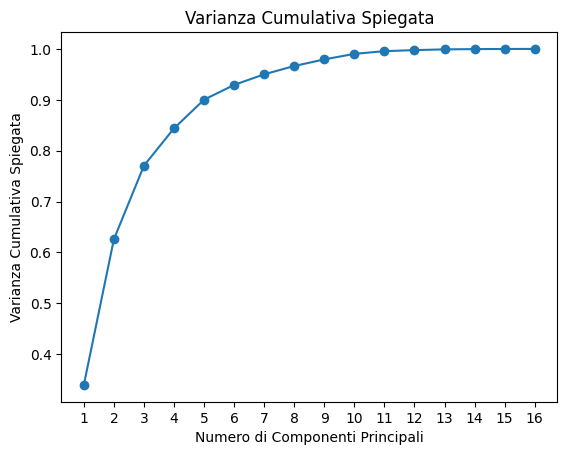

In [71]:
plt.plot(range(1, len(varianza_cumulativa) + 1), varianza_cumulativa, marker='o')
plt.title('Varianza Cumulativa Spiegata')
plt.xlabel('Numero di Componenti Principali')
plt.ylabel('Varianza Cumulativa Spiegata')
plt.xticks(range(1, len(varianza_cumulativa) + 1))
plt.show()

Si vede dal grafico che circa l'80% della varianza spiegata si ottiene con tre componenti principali, ottimo compromesso anche sul numero di PC. Infatti, una rappresentazione tridimensionale dei dati è ancora interpretabile. Per cui si modifica il dataframe a disposizione, ovvero i predictor, con tre PC.

In [72]:
num_componenti = 3
PCA3 = PCA(n_components=num_componenti)
componenti_principali = PCA3.fit_transform(cv19_scalato)
pca_data = pd.DataFrame(componenti_principali)
pca_data

,0,1,2
0,-0.361109,0.040502,0.255089
1,-1.092519,0.717461,1.445612
2,1.951770,-1.869942,-0.449171
3,-0.108581,-0.956980,0.169532
4,-1.193370,2.018213,1.643515
...,...,...,...
87,0.464863,-1.977728,-0.478767
88,1.033490,-1.427137,1.509575
89,0.603059,0.406943,-0.264534
90,-3.126544,1.474443,-0.332803


Di seguito vengono mostrati i pesi delle componenti principali, con l'ausilio di una heatmap:

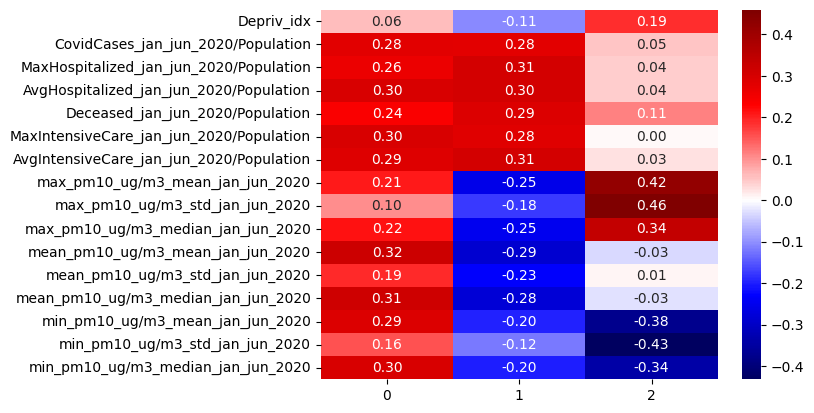

In [73]:
ax = sns.heatmap(PCA3.components_.T, yticklabels=cv19_scalato.columns, annot=True, fmt='.2f', cmap="seismic", center=0)

La figura appena mostrata mostra il contributo di ogni features alla creazione della singola componente principale. Si può vedere come la prima, ovvero la più importante, cioè quella con varianza spiegata maggiore, sia frutto del contributo di tutte le features. Solo tre di esse hanno un contributo scarso in essa. La seconda componente principale, invece, riceve contributi solamente dalle features epidemiologiche, mentre la terza solo da alcune features relative all'inquinamento. Queste due ultime separano bene le features epidemiologiche da quelle geografiche, il che è in linea con le suddivisioni fatte in punti precedenti del progetto

Di seguito un semplice cambiamento dei nomi delle features create, per semplicità.

In [74]:
nomi_pc = [f'PC{i}' for i in range(1, num_componenti + 1)]
cv19_pca = pd.DataFrame(data=componenti_principali, columns=nomi_pc)
cv19_pca

,PC1,PC2,PC3
0,-0.361109,0.040502,0.255089
1,-1.092519,0.717461,1.445612
2,1.951770,-1.869942,-0.449171
3,-0.108581,-0.956980,0.169532
4,-1.193370,2.018213,1.643515
...,...,...,...
87,0.464863,-1.977728,-0.478767
88,1.033490,-1.427137,1.509575
89,0.603059,0.406943,-0.264534
90,-3.126544,1.474443,-0.332803


Ora si esegue di nuovo la clusterizzazione utilizzando il nuovo dataframe

In [75]:
# KMeans per k=2 fino a k=18
inerzie_pca = []
for k in valori_k:
    kmeans = KMeans(n_clusters=k, random_state=8)
    new_col = f"{k}_PCA"
    cv19_norm_pop[new_col] = kmeans.fit_predict(cv19_pca) 
    cv19_norm_pop[new_col] = cv19_norm_pop[new_col].astype("category") #cosa fa?
    inerzie_pca.append(kmeans.inertia_)

In [76]:
cv19_norm_pop.iloc[:,-17:]

,2_PCA,3_PCA,4_PCA,5_PCA,6_PCA,7_PCA,8_PCA,9_PCA,10_PCA,11_PCA,12_PCA,13_PCA,14_PCA,15_PCA,16_PCA,17_PCA,18_PCA
0,0,2,0,1,0,0,5,7,1,9,1,2,3,8,6,1,12
1,0,1,2,4,0,0,4,7,1,9,1,2,3,8,9,10,17
2,0,2,0,3,5,5,2,4,5,7,9,10,13,9,11,5,2
3,0,2,0,1,5,5,2,4,5,7,4,10,10,11,4,5,11
4,0,1,3,0,2,6,1,7,2,9,1,2,12,0,9,16,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,0,2,0,1,5,5,2,4,5,7,4,1,10,11,11,9,9
88,0,2,2,4,3,1,4,2,1,10,8,9,4,1,7,0,2
89,0,2,0,1,0,3,0,7,4,5,0,6,6,12,2,11,0
90,0,1,3,0,2,6,1,3,9,2,11,0,2,5,1,4,1


E come fatto per l'algoritmo KMeans, si costruisce un plot della variazione dell'inerzia al variare del numero di cluster.

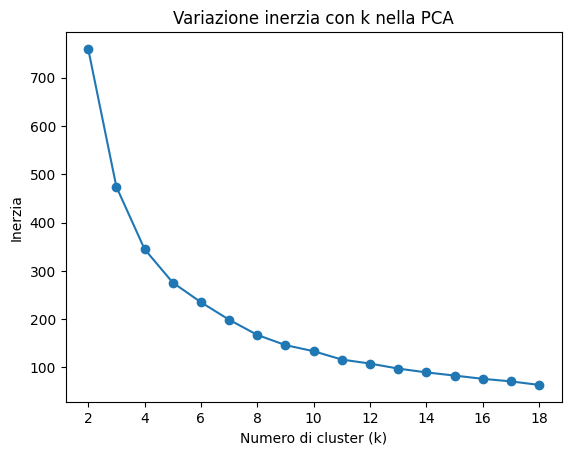

In [77]:
# Visualizzazione il grafico dell'inerzia
plt.plot(valori_k, inerzie_pca, marker='o')
plt.xlabel('Numero di cluster (k)')
plt.ylabel('Inerzia')
plt.title('Variazione inerzia con k nella PCA')
plt.show()

Confrontando il grafico ottenuto dall'utilizzo del KMeans sul dataframe originario con quello ottenuto dalla PCA, si vede che la scala dell'inerzia è stata ridotta in quest'ultimo caso, indice del fatto che la PCA a 3 componenti principali risulta migliore per la clusterizzazione nel caso in esame, nello spazio delle componenti principali. Un'inerzia minore significa una minor dispersione dei dati all'interno dei cluster, quindi una clusterizzazione meglio riuscita.

Il grafico sopra mostra di nuovo una decrescita sensibile dell'inerzia per un numero di cluster compreso tra 3 e 5. Se si confronta la clusterizzazione precedente a 3 cluster con quella fatta su 3 PC (3 viene dalla scelta fatta sopra guidata dalla varianza spiegata), ci si accorge che è identica. Infatti: 

In [78]:
cv19_norm_pop.loc[cv19_norm_pop["3_PCA"].replace(0,"A").replace(1,"B").replace(2,"C")!=cv19_norm_pop["3_cluster"].replace(0,"A").replace(1,"B").replace(2,"C")]

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,9_PCA,10_PCA,11_PCA,12_PCA,13_PCA,14_PCA,15_PCA,16_PCA,17_PCA,18_PCA


Zero righe, quando è stato espressamente richiesta la non uguaglianza tra le colonne relative a 3 cluster e 3 PC

In [81]:
features_cluster = cv19_norm_pop.iloc[:,-17:].columns.tolist()

In [82]:
dati_pca = cv19_norm_pop.join(cv19_pca)
dati_pca

,City,lat,lng,Population,Density,Surface,Depriv_idx,CovidCases_jan_jun_2020,MaxHospitalized_jan_jun_2020,AvgHospitalized_jan_jun_2020,...,12_PCA,13_PCA,14_PCA,15_PCA,16_PCA,17_PCA,18_PCA,PC1,PC2,PC3
0,Acquasparta,42.691173,12.546451,4611,57.00,81.61,1.013507,6,1,0.273585,...,1,2,3,8,6,1,12,-0.361109,0.040502,0.255089
1,Allerona,42.812033,11.973053,1722,21.00,82.61,-1.309272,3,1,0.336735,...,1,2,3,8,9,10,17,-1.092519,0.717461,1.445612
2,Alviano,42.588208,12.295936,1428,60.00,23.90,-2.148882,2,1,0.252632,...,9,10,13,9,11,5,2,1.951770,-1.869942,-0.449171
3,Amelia,42.553528,12.416776,11852,89.00,132.50,-0.832084,5,1,0.317308,...,4,10,10,11,4,5,11,-0.108581,-0.956980,0.169532
4,Arrone,42.583433,12.769865,2703,66.00,41.04,-0.479919,7,1,0.475728,...,1,2,12,0,9,16,17,-1.193370,2.018213,1.643515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,Tuoro_sul_Trasimeno,43.206848,12.074615,3810,68.00,55.89,-1.037773,0,0,0.000000,...,4,1,10,11,11,9,9,0.464863,-1.977728,-0.478767
88,Umbertide,43.305636,12.336622,16598,83.00,200.83,1.316157,29,4,1.010526,...,8,9,4,1,7,0,2,1.033490,-1.427137,1.509575
89,Valfabbrica,43.158897,12.600896,3286,36.00,92.30,0.868986,8,3,0.473684,...,0,6,6,12,2,11,0,0.603059,0.406943,-0.264534
90,Vallo_di_Nera,42.754621,12.863760,357,9.86,36.22,1.624309,0,0,0.000000,...,11,0,2,5,1,4,1,-3.126544,1.474443,-0.332803


In [85]:
def build_scatter_3d_updater(dataframe, title='Scatter Plot 3D', **kwargs):
    def scatter_3d_updater(x_feature, y_feature, z_feature, color_feature):
        fig = px.scatter_3d(dataframe, x=x_feature, y=y_feature, z=z_feature, color=color_feature, **kwargs)
        fig.update_layout(title=title)
        fig.show()
        
    return scatter_3d_updater

x_dropdown_3d = widgets.Dropdown(options=['PC1', 'PC2', 'PC3'], description='asse x:', value='PC1')
y_dropdown_3d = widgets.Dropdown(options=['PC1', 'PC2', 'PC3'], description='asse y:', value='PC2')
z_dropdown_3d = widgets.Dropdown(options=['PC1', 'PC2', 'PC3'], description='asse z:', value='PC3')
color_dropdown_3d = widgets.Dropdown(options=features_cluster, description='Colore :', value='3_PCA')

output_3d = widgets.interactive_output(
    build_scatter_3d_updater(dati_pca, title="Clusters sullo spazio delle componenti principali", hover_name="City",
        width=850, height=600), { 'x_feature': x_dropdown_3d, 'y_feature': y_dropdown_3d, 'z_feature': z_dropdown_3d, 'color_feature': color_dropdown_3d}
)

display(x_dropdown_3d, y_dropdown_3d, z_dropdown_3d, color_dropdown_3d, output_3d)

Dropdown(description='asse x:', options=('PC1', 'PC2', 'PC3'), value='PC1')

Dropdown(description='asse y:', index=1, options=('PC1', 'PC2', 'PC3'), value='PC2')

Dropdown(description='asse z:', index=2, options=('PC1', 'PC2', 'PC3'), value='PC3')

Dropdown(description='Colore :', index=1, options=('2_PCA', '3_PCA', '4_PCA', '5_PCA', '6_PCA', '7_PCA', '8_PC…

Output()

I cluster nello spazio delle PC rivelano la distanza dei dati di Porano e Giove dagli altri. Questi ultimi, invece, sono piuttosto compatti, per cui si è scelto di minimizzare il più possibile il numero di cluster per non complicare la lettura, optando per 3 cluster.

### Grafico su Mappa
Come fatto per il caso di clusterizzazione tramite KMeans, si mostrano i risultati su una mappa:

In [84]:
map_cluster_PCA = folium.Map(location=[df['lat'].mean(), df['lng'].mean()], zoom_start=8)

visualizzazione_feature_PCA = widgets.Dropdown(
    options=features_cluster, description='PC da visualizzare:', value='3_PCA')

input_mappa_PCA = widgets.interactive_output(
    choropleth_aggiornabile(
        mappa_iniziale=map_cluster_PCA,
        dati_geografici=gdf,
        dati=cv19_norm_pop,
        col_condivisa="name",
        par_geo='feature.properties.name',
        tooltip_features=["Zone"],
        fill_color='Reds_r',
        fill_opacity=0.7,
        line_opacity=0.2,
        highlight=True,
        smooth_factor=0.5,
        overlay=True), { 'color_col': visualizzazione_feature_PCA })

display(visualizzazione_feature_PCA, input_mappa_PCA)

Dropdown(description='PC da visualizzare:', index=1, options=('2_PCA', '3_PCA', '4_PCA', '5_PCA', '6_PCA', '7_…

Output()

### Supervised Learning

#### Regression

8. Utilizzare due metodi per effettuare una regressione della feature `CovidCases_jan_jun_2020 / Population`
avendo come input le seguenti colonne:

  * lat
  * lng
  * Surface
  * mean_pm10_ug/m3_mean_jan_jun_2020
  * mean_pm10_ug/m3_std_jan_jun_2020
  * mean_pm10_ug/m3_median_jan_jun_2020

  8.1 Verificare quindi l'addestramento.

  8.2 **Extra**: 
  * fare un grafico del test set durante la fase di training
  * fare un grafico della predizione del test set

## Supervised Learning:
In questa parte si sono sviluppati due differenti modelli per fare una regressione sul target proposto dall'esercizio. Lo scopo è addestrare un modello su un subset dei dati a disposizione e verificare le sue previsioni nei dati rimanenti. La bontà e l'accuratezza verranno determinate da alcune metriche di valutazione, discusse in seguito, da cui si potrà determinare l'effettiva utilità dei predictors proposti nella previsione del target. In altre parole, si potrà discutere un'eventuale relazione tra le features geografiche (inquinamento e dati geografici veri e propri) e la feature epidemiologia, che è lo scopo del progetto.  

Prima di tutto sono stati preparati i dati, creando un dataframe contenente i predictor richiesti e il target. 

NOTA: nella cella sottostante, a causa di scelte precedenti sulla denominazione del dataframe nei vari punti del progetto, si è dovuta selezionare la sola colonna di output da un dataframe differente rispetto a quello da cui si sono presi i predictors. Il risultato finale è un dataframe con 7 colonne, una di output e le altre di input, come richiesto dall'esercizio.

In [121]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold, cross_val_score, train_test_split

#Per prima cosa si selezionano le colonne di input richieste dall'esecizio e si costruisce il 
input = ['lat', 'lng', 'Surface', 'mean_pm10_ug/m3_mean_jan_jun_2020', 'mean_pm10_ug/m3_std_jan_jun_2020',
         'mean_pm10_ug/m3_median_jan_jun_2020']
output = ['CovidCases_jan_jun_2020/Population']
cv19_output = cv19_norm_pop[output] 
cv19 = pd.concat([cv19_cleared, cv19_output], axis=1)
cv19_regression = cv19.loc[:, output+input]

In [122]:
cv19_regression

,CovidCases_jan_jun_2020/Population,lat,lng,Surface,mean_pm10_ug/m3_mean_jan_jun_2020,mean_pm10_ug/m3_std_jan_jun_2020,mean_pm10_ug/m3_median_jan_jun_2020
0,0.001301,42.691173,12.546451,81.61,16.448845,7.735424,15.089290
1,0.001742,42.812033,11.973053,82.61,16.009011,8.708984,14.280218
2,0.001401,42.588208,12.295936,23.90,22.556083,11.939011,19.562969
3,0.000422,42.553528,12.416776,132.50,18.391294,8.453660,16.210499
4,0.002590,42.583433,12.769865,41.04,13.751943,6.993753,12.296421
...,...,...,...,...,...,...,...
87,0.000000,43.206848,12.074615,55.89,19.158259,14.846033,16.056410
88,0.001747,43.305636,12.336622,200.83,17.415113,12.497089,14.874236
89,0.002435,43.158897,12.600896,92.30,16.041621,10.768399,14.275885
90,0.000000,42.754621,12.863760,36.22,11.821318,6.803103,10.104532


In [123]:
x = cv19_regression.loc[:,input] #separazione di input e output in un dataframe e una serie, rispettivamente
y = cv19_regression[output]

In [124]:
x

,lat,lng,Surface,mean_pm10_ug/m3_mean_jan_jun_2020,mean_pm10_ug/m3_std_jan_jun_2020,mean_pm10_ug/m3_median_jan_jun_2020
0,42.691173,12.546451,81.61,16.448845,7.735424,15.089290
1,42.812033,11.973053,82.61,16.009011,8.708984,14.280218
2,42.588208,12.295936,23.90,22.556083,11.939011,19.562969
3,42.553528,12.416776,132.50,18.391294,8.453660,16.210499
4,42.583433,12.769865,41.04,13.751943,6.993753,12.296421
...,...,...,...,...,...,...
87,43.206848,12.074615,55.89,19.158259,14.846033,16.056410
88,43.305636,12.336622,200.83,17.415113,12.497089,14.874236
89,43.158897,12.600896,92.30,16.041621,10.768399,14.275885
90,42.754621,12.863760,36.22,11.821318,6.803103,10.104532


In [125]:
y

,CovidCases_jan_jun_2020/Population
0,0.001301
1,0.001742
2,0.001401
3,0.000422
4,0.002590
...,...
87,0.000000
88,0.001747
89,0.002435
90,0.000000


Come si vede, x e y contengono rispettivamente i 6 predictors e il target.

Fatto ciò, si è separato il dataframe in valori dei predictors utilizzati per il training del modello e valori utilizzati per il test. Stesso processo per i valori a disposizione del target. 

In [127]:
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.4, random_state = 15)

## Modello con Regressione Lineare
Data la sua semplicità nello sviluppo e nell'interpretazione, si utilizza un modello lineare con il metodo dei minimi quadrati come prima scelta.  
Nel farlo, si è aggiunta una costante a rappresentare l'intercetta nel modello, così da aggiungere un grado di libertà extra ed evitare di vincolare il modello.  
Di seguito il fitting del modello sui dati di training, seguito dalla presentazione delle metriche risultanti.

In [128]:
# Aggiunta dell'intercetta
x_train_intercetta = np.c_[np.ones(len(x_train)), x_train]

model = LinearRegression()
model.fit(x_train_intercetta, y_train) #addestramento del modello nel training set

intercetta = model.intercept_ #determinazione di intercetta e coefficienti di ogni predictor
coefficienti = model.coef_
print("Intercetta: ", intercetta, '\n')
print("Coefficienti:")
coefficienti

Intercetta:  0.05662570204009016 

Coefficienti:


array([ 0.00000000e+00, -1.81040331e-03,  1.54472309e-03,  2.47017626e-06,
        4.27852906e-04,  2.98957750e-04, -5.06166330e-04])

Una rapida occhiata ai coefficienti è sufficiente a dire che alcuni di loro sembrano essere molto meno utili di altri. Infatti, il coefficiente più grande è dell'ordine di 10 alla -3, mentre alcuni sono dell'ordine di 10 alla -4 / -6, significativamente inferiori al dominante. Questo fatto potrebbe far pensare ad una possibile riduzione dimensionale dello spazio dei predictors.

In [129]:
# Calcolo delle previsioni sul training set e MSE, R2
y_train_pred = model.predict(x_train_intercetta)
rmse_training = np.sqrt(mean_squared_error(y_train, y_train_pred))
r2_training = r2_score(y_train, y_train_pred)

print("RMSE di Training: ", rmse_training, '\n')
print("R-squared di Training: ", r2_training ,'\n')


RMSE di Training:  0.0011874201734368413 

R-squared di Training:  0.20217497054956424 



Ora, le metriche appena mostrate sono universalmente accettate per la misura della bontà del modello. In particolare, il valore di R-squared può dire se i predictor usati siano o no correlati con il target. È definito come (1 - RSS/TSS), dove RSS è la somma dei quadrati delle differenze tra i valori osservati e i valori previsti dal modello, mentre TSS è la somma totale dei quadrati tra i valori osservati e la loro media.  

Può assumere valori da -infinito a 1, e un buon modello dovrebbe mostrare un R-squared il più possibile vicino ad 1. Significherebbe avere una forte relazione lineare tra il target e gli input. Se è negativo, significa che il modello non si adatta bene ai dati esaminati.  

Nel caso in esame, il valore è vicino a 0.2 e significherebbe un modello non adatto ai dati. Però il valore mostrato è relativo ai dati di training, ovvero i dati su cui si è addestrato il modello. Vuol dire che se si varia la porzione di dati per il training, questo valore varierà e non può essere usato come metrica per l'accuratezza delle previsioni.  
Il valore di R-squared calcolato sul dataset di test può dare, invece, un'indicazione veritiera sulla bontà del modello, perchè prende in considerazione dati non usati per l'addestramento.

Terminata la fase di training, dunque, si passa alla predizione del modello sul test set a disposizione.

In [131]:
x_test_intercetta = np.c_[np.ones(len(x_test)), x_test]
y_test_pred = model.predict(x_test_intercetta)

rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
r2_test = r2_score(y_test, y_test_pred)

print("RMSE di Test: ", rmse_test, '\n')
print("R-squared di Test: ", r2_test ,'\n')

RMSE di Test:  0.004270887252442719 

R-squared di Test:  -0.08044480749221128 



Si vede come il test error sia significativamente maggiore del training error, quasi di un fattore 4. Questo fatto non da molto credito al modello. Inoltre, R-squared di test è negativo, eventualità descritta sopra.  
Ora, tutto il procedimento è derivante da una particolare scelta per la divisione dei dati. Per rendere il calcolo delle metriche di valutazione più "robusto", si può usare la K-fold cross-validation, in modo da poter interpretare i risultati in modo corretto. 

In [132]:
model_cv = LinearRegression() #modello lineare per la cross-validation

# Creazione di un oggetto KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=15)

# Calcolo delle metriche utilizzando la cross-validation
r2_scores = cross_val_score(model_cv, x, y, scoring='r2', cv=kf)
rmse_scores = cross_val_score(model_cv, x, y, scoring='neg_root_mean_squared_error', cv=kf)

print("Media R-squared: ", np.mean(r2_scores))
print("Media RMSE: ", -np.mean(rmse_scores))

Media R-squared:  -0.9948010439781217
Media RMSE:  0.0029636785122974844


L'RMSE è salito di un fattore 3 rispetto a quello di training. R-squared risulta essere negativo, e peggiora all'aumentare del numero di fold scelti per la cross-validation. Si è scelto k=5 per ratica comune. 

Ricordiamo che R-squared è interpretabile come il grado di correlazione tra i predictors e il target e la sua lontananza da 1 indica l'incapacità del modello lineare OLS di spiegare l'eventuale correlazione delle features con il target in esame.  

Altro parametro rilevante nella costruzione di un modello è il p-value di ogni coefficiente, ovvero un'indicazione sulla probabilità che il parametro stimato dal modello (relativo ad un particolare predictor) sia compatibile con l'ipotesi nulla. Quest'ultima inidica la mancanza di relazione tra il predictor e il terget, per cui un p-value piccolo indica un predictor utile alla stima, viceversa per un p-value elevato.  
Per visualizzare i p-value si utilizza una libreria particolare:

In [133]:
import statsmodels.api as sm
ols = sm.OLS(y_train, x_train_intercetta).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.202
Model:                            OLS   Adj. R-squared:                  0.037
Method:                 Least Squares   F-statistic:                     1.225
Date:                Mon, 08 Jan 2024   Prob (F-statistic):              0.322
Time:                        17:14:54   Log-Likelihood:                 191.41
No. Observations:                  36   AIC:                            -368.8
Df Residuals:                      29   BIC:                            -357.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0566      0.119      0.475      0.639      -0.187       0.301
x1            -0.0018      0.003     -0.620      0.540      -0.008       0.004
x2             0.0015      0.001      1.272      0.214      -0.001       0.004
x3           2.47e-06   1.84e-06      1.339      0.191    -1.3e-06    6.24e-06
x4             0.0004      0.001      0.412      0.683      -0.002       0.003
x5             0.0003      0.001      0.550      0.586      -0.001       0.001
x6            -0.0005      0.001     -0.508      0.615      -0.003       0.002
==============================================================================
Omnibus:                       12.613   Durbin-Watson:                   2.340
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               12.521
Skew:                           1.220   Prob(JB):                      0.00191
Kurtosis:                       4.546   Cond. No.                     9.38e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Come si vede dall'output della precedente cella, i p-value di ogni singolo predictor sono molto elevati, indice del fatto che non possono escludere la null-hypothesis, cioè non si può dire con certezza che siano rilevanti nella previsione del target.

In conclusione, il modello lineare OLS costruito non trova alcuna correlazione tra i predictor utilizzati e il target in esame e non è in grado di fornire previsioni accurate di quest'ultimo.

In precedenza è stata posta l'attenzione sui coefficienti dei predictors del modello lineare e sui loro ordini di grandezza. È stata citata la possibilità di applicare una riduzione dimensionale per togliere alcuni dei predictors non rilevanti. Questo può essre fatto in vari modi, tra cui la Ridge Regression

## Ridge Regression
La Ridge Regression è un metodo di "shrinkage", ovvero un metodo che aggiunge delle penalità quando si aggiungono predictors al modello. In particolare, è un tipo di regressione lineare differente da OLS, che sostituisce la scelta dei coefficienti che minimizzano la somma dei quadrati dei residui (RSS) con quelli che minimizzano RSS + alpha(somma dei quadrati dei coefficienti stimati).  
La sostanza del metodo è che se un determinato predictor non ha un peso rilevante sulla previsione del target, il suo coefficiente viene "strizzato" verso lo zero per fare in modo che il predictor sia quasi completamente escluso dal modello. È una pratica molto vicina ad una subset selection, cioè ci si avvicina alla selezione di un subset di predictors da quelli di partenza.  

Per allenare il modello ed eseguire la regressione, si utilizza lo stesso splitting dei dati fatto per il modello lineare, quindi non viene ripetuta questa operazione. Però, data la presenza della somma della radice dei coefficienti nella funzione per la Ridge Regression, vanno scalati i predictors prima di eseguire la regressione stessa.  
 
Nella cella sottostante, lambda è un parametro che regola la penalizzazione caratteristica della Ridge Regression e può essere modificato.  
La struttura della cella è come quella della regressione lineare: addestramento del modello sui dati di training, previsione sui dati di test, estrazione delle metriche di valutazione, il tutto dopo lo scaling dei dati

In [134]:
from sklearn.linear_model import Ridge

df2 = cv19_regression.copy()
#Funzione di scaling dei dati
def funzione_scaling(df):
    for col in df.columns:
        media_col = df[col].mean()
        n = len(df)
        somma_quadrati = ((df[col] - media_col) ** 2).sum()
        df[col] = df[col] / np.sqrt(somma_quadrati/n)
    return df

cv19_ridge = funzione_scaling(df2)
cv19_ridge

,CovidCases_jan_jun_2020/Population,lat,lng,Surface,mean_pm10_ug/m3_mean_jan_jun_2020,mean_pm10_ug/m3_std_jan_jun_2020,mean_pm10_ug/m3_median_jan_jun_2020
0,0.391525,155.496217,43.306489,0.852121,4.954296,3.504925,5.032625
1,0.524193,155.936433,41.327297,0.862562,4.821821,3.946045,4.762781
2,0.421410,155.121183,42.441789,0.249549,6.793760,5.409572,6.524699
3,0.126935,154.994867,42.858891,1.383483,5.539350,3.830358,5.406573
4,0.779211,155.103792,44.077646,0.428514,4.142005,3.168873,4.101139
...,...,...,...,...,...,...,...
87,0.000000,157.374487,41.677856,0.583569,5.770356,6.726745,5.355181
88,0.525709,157.734310,42.582226,2.096942,5.245330,5.662438,4.960899
89,0.732530,157.199834,43.494418,0.963739,4.831642,4.879167,4.761335
90,0.000000,155.727319,44.401743,0.378187,3.560512,3.082490,3.370093


In [135]:
x = cv19_ridge.loc[:,input] 
y = cv19_ridge[output]
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.4, random_state = 15)

In [136]:
Lambda = 1.0 
ridge = Ridge(alpha=Lambda)
ridge.fit(x_train, y_train)

y_pred_ridge = ridge.predict(x_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
r2 = r2_score(y_test, y_pred_ridge)

print('RMSE: ', rmse, '\n')
print('R2: ', r2, '\n')

RMSE:  1.2844773672922754 

R2:  -0.07947756109003179 



Ora, una regressione così fatta non è significativa perchè il parametro lambda è stato fissato ad 1 senza nessun criterio. La libreria sklearn fornisce un metodo che permette di scegliere automaticamente il miglior valore di lambda per la regressione all'interno di un set di valori forniti. Di seguito il procedimento descritto:

In [137]:
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve

Lambdas = np.logspace(-6, 6, 35) 
ridge_cv_model = RidgeCV(alphas=Lambdas, store_cv_values=True)
ridge_cv_model.fit(x_train, y_train)
miglior_lambda = ridge_cv_model.alpha_
print('Miglior Lambda: ', miglior_lambda, '\n')

Miglior Lambda:  1000000.0 



Si costruisce di seguito un grafico chiamato "Validation Curve", che mostra l'andamento del Mean Square Error al variare del valore di Lambda.

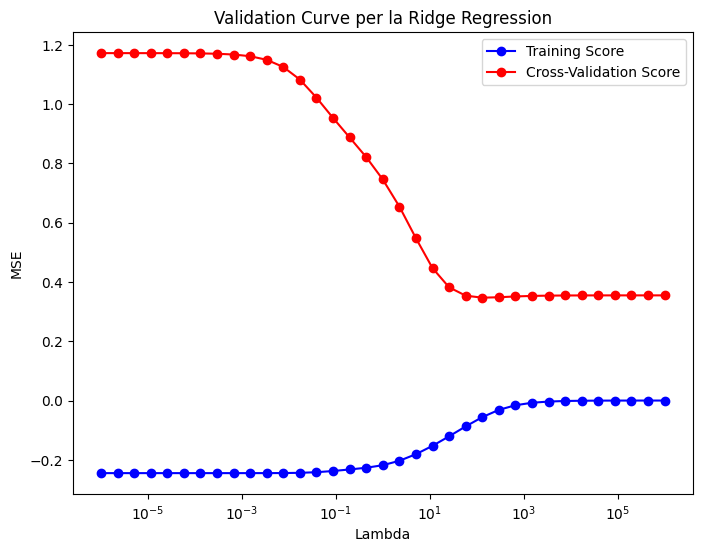

In [138]:
#curva di validazione per vedere l'andamento dei lambda
training_scores, test_scores = validation_curve(Ridge(), x_train, y_train, param_name="alpha", param_range=Lambdas, cv=5)
media_train_score = -np.mean(training_scores, axis=1)
media_test_score = -np.mean(test_scores, axis=1)

# Plot della curva di validazione
plt.figure(figsize=(8, 6))
plt.semilogx(Lambdas, media_train_score, label="Training Score", color="blue", marker="o")
plt.semilogx(Lambdas, media_test_score, label="Cross-Validation Score", color="red", marker="o")
plt.title("Validation Curve per la Ridge Regression")
plt.xlabel("Lambda")
plt.ylabel("MSE")
plt.legend(loc="best")
plt.show()

L'algoritmo usato per la cross validation fornisce, come miglior lambda, l'estremo superiore del range di valori utilizzati per la sua determinazione. Il criterio usato per la scelta è la minimizzazione dell'MSE. Si può vedere come il Cross-Validation Score resti più o meno costante sopra un certo valore di lambda, sicuramente sopra a 10^3. Questo per dire che non è necessario impostare lambda al valore fornito dalla cross-validation ma sarebbe sufficiente impostarlo ad un valore superiore a 1000.

Ora, una volta ottenuto il miglior valore di Lambda per la Ridge Regression in esame, va eseguita di nuovo la regressione utilizzando questo valore:

In [139]:
ridge = Ridge(alpha=miglior_lambda)
ridge.fit(x_train, y_train)
coeff_ridge = ridge.coef_
interc_ridge = ridge.intercept_

In [140]:
coeff_ridge

array([[ 1.04283727e-06,  3.14107023e-06,  3.90206885e-06,
        -5.53540789e-07,  1.47882998e-06, -1.23229231e-06]])

Come spiegato in precedenza, la Ridge Regression penalizza i predictors inutili per la previsione del modello. Nella cella superiore si è eseguito il fit con il miglior lambda ottenuto dalla cross-validation e sono stati mostrati i coefficienti risultanti dallo shrinkage. Se alcuni di essi fossero stati utili alla previsione del target, sarebbero dovuti essere sensibilmente diversi da zero. Invece sono stati ottenuti tutti valori in 10 alla -6, il che aumenta la tesi sull'inadeguatezza dei modelli lineari ad adattarsi ai dati a disposizione.

In [141]:
y_pred_ridge = ridge.predict(x_test)

rmse1 = np.sqrt(mean_squared_error(y_test, y_pred_ridge))
r2_1 = r2_score(y_test, y_pred_ridge)

print('RMSE: ', rmse1, '\n')
print('R2: ', r2_1, '\n')

RMSE:  1.2482166973018036 

R2:  -0.019390735120946356 



Le metriche mostrate confermano le affermazioni precedenti.

## Regressione tramite Boosted Decision Tree (BDT)

Dato che i modelli lineari si sono mostrati inadeguati per i dati di questo progetto, si sceglie di andare oltre la linearità e provare ad usare dei metodi basati sugli alberi decisionali. Questi ultimi sono caratterizzati da un'elevata semplicità ed interpretabilità, in generale. Però, non essendo competitivi con altri metodi di supervised learning in termini di accuratezza delle previsioni, esistono delle varianti che mogliorano notevolmente questo aspetto.  
In questo caso si è sceglto di utilizzare la tecnica del Boosting Decision Tree, in cui vengono cresciuti sequenzialmente un certo numero di alberi decisionali su campioni di dati bootstrap. Ogni albero apprende dal precedente.

Per prima cosa, si è allenata una BDT sui dati di training, come fatto per gli altri modelli e sono state calcolate le metriche di valutazione.

In [142]:
from sklearn.ensemble import GradientBoostingRegressor

BDT = GradientBoostingRegressor(n_estimators=100, learning_rate=0.01, max_depth=5, random_state=42)
BDT.fit(x_train, y_train)

rmse_BDT = np.sqrt(mean_squared_error(y_test, BDT.predict(x_test)))
r2_BDT = r2_score(y_test, BDT.predict(x_test))

print(f'RMSE di Test: {rmse_BDT}')
print(f'R-squared: {r2_BDT}')

RMSE di Test: 1.2379241584402585
R-squared: -0.002648672866345292


C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



I valori ottenuti dalle metriche sono in linea con le considerazioni fatte per i modelli lineari precedentemente trattati. Ora, una BDT ha dei parametri modificabili che influiscono sul risultato.  
Questi parametri sono:
- Numero di Tree che vengono cresciuti dal metodo, indicato con "n_estimators";
- Valore del parametro di shrinkage ("learning_rate"), che in questo caso regola la velocità di apprendimento del metodo;
- Numero di splits che ogni Tree deve presentare ("max_depth");

La scelta di questi parametri nell'addestramento appena eseguito è arbitraria, ma serve trovare il miglior set di parametri possibile. Questo è stato fatto utilizzando la cross-validation su una griglia di parametri prestabilita.

In [145]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor

BDT = GradientBoostingRegressor(random_state=42)
griglia_parametri = {'n_estimators': list(range(1, 101, 1)), 'learning_rate': [0.001, 0.01, 0.1], 'max_depth': list(range(3, 10, 1))}

ricerca_parametri = GridSearchCV(estimator=BDT, param_grid=griglia_parametri, scoring='neg_mean_squared_error', cv=10)
ricerca_parametri.fit(x_train, y_train)
print("Migliori parametri:", ricerca_parametri.best_params_)

miglior_BDT = ricerca_parametri.best_estimator_

C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\alo19\AppData

Migliori parametri: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 74}


C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [117]:
miglior_BDT.fit(x_train, y_train)

rmse_miglior_BDT = np.sqrt(mean_squared_error(y_test, miglior_BDT.predict(x_test)))
r2_miglior_BDT = r2_score(y_test, miglior_BDT.predict(x_test))

print(f'RMSE : {rmse_miglior_BDT}')
print(f'R-squared: {r2_miglior_BDT}')

RMSE : 1.2362237768508406
R-squared: 0.00010386158981923188


C:\Users\alo19\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Anche con i parametri migliori, risultati della cross-validation, le metriche di valutazione non variano molto rispetto al caso lineare e si possono dunque trarre le stesse conclusioni.   

Dai risultati trovati fino ad ora, non sembra esserci nessuna relazione utile a stimare il target a partire dai predictors proposti dall'esercizio.

### Importanza dei Predictors
Di seguito, per terminare lo studio in esame, viene mostrato un grafico dell'importanza dei singoli predictors all'interno del modello. L'attributo "feature_importances_" restituisce l'importanza relativa del predictor nella costruzione della BDT. L'importanza è calcolata in base a quanto ciascun predictor contribuisce alla riduzione della RSS durante la costruzione dei Tree.

L'importanza di un predictor è calcolata sommando il contributo di quest'ultimo a ciascun Tree della BDT, pesato per il miglioramento (o la riduzione della funzione di costo) che apporta a ciascun nodo dell'albero. In generale, il processo è descrivibile come segue:

1. **Calcolo del miglioramento del nodo:** Per ogni nodo di ogni Tree, viene calcolato quanto la suddivisione basata su un particolare predictor riduce l'RSS. Questo è il miglioramento che il predictor apporta al nodo.

2. **Somma dei miglioramenti per ogni predictor:** L'importanza di ciascun predictor è ottenuta sommando il suo miglioramento su tutti i nodi di tutti i Tree della BDT.

3. **Normalizzazione:** L'importanza totale di tutte le feature è normalizzata in modo che la somma di tutte le importanze sia 1.

Più è alta la riduzione dell'RSS e maggiore sarà l'importanza totale normalizzata di un predictor.

In [146]:
importances = miglior_BDT.feature_importances_
nomi_predictors = x.columns.tolist()  
df_importances = pd.DataFrame({'Predictor': nomi_predictors, 'Importanza': importances})

df_importances = df_importances.sort_values(by='Importanza', ascending=False)

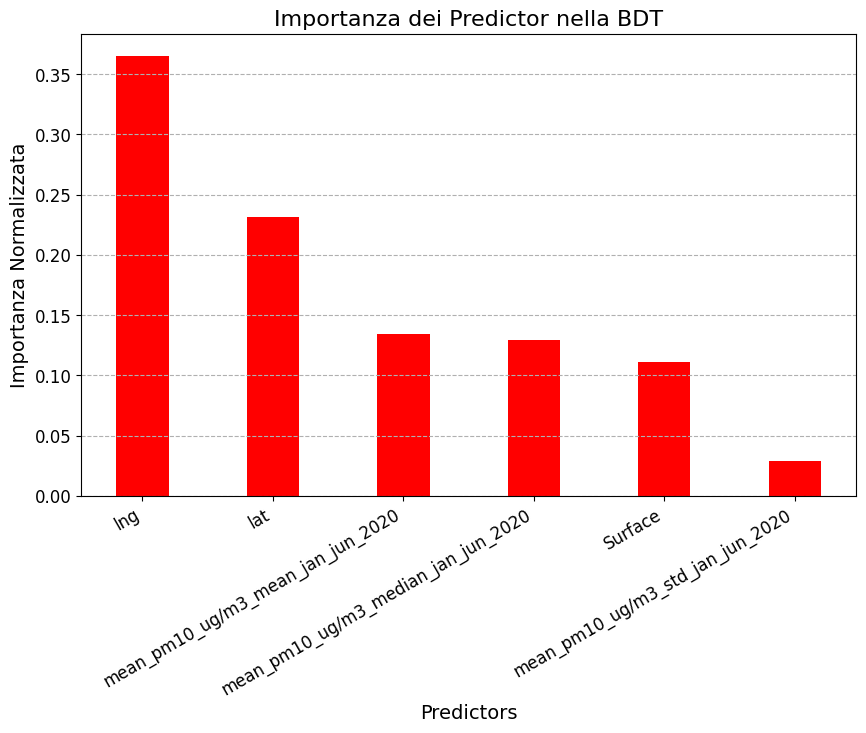

In [161]:
plt.figure(figsize=(10, 6))
plt.bar(df_importances['Predictor'], df_importances['Importanza'], color='Red', width=0.4)
plt.xlabel('Predictors', fontsize=14)
plt.ylabel('Importanza Normalizzata', fontsize=14)
plt.title('Importanza dei Predictor nella BDT', fontsize=16)
plt.xticks(rotation=30, ha="right", fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=1) 
plt.show()

Dato che il progetto riguarda lo studio della relazione tra inquinamento ed epidemiologia da Covid 19, il fatto che le features con maggiore importanza siano relative a latitudine e longitudine avvalore ancor di più la tesi sulla mancata relazione tra le macro-aree di interesse.